In [19]:


import matplotlib.pyplot as plt
import numpy as np
import nibabel as nib
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torchvision.transforms as transforms
from glob import glob
import random
import SimpleITK as sitk
import pandas as pd
import nibabel as nb
import torch.nn.functional as F
import os

In [3]:
IMG_FILE_NAMES = glob('wCF_*')
if len(IMG_FILE_NAMES)>0:
    print(len(IMG_FILE_NAMES),' matching files found:',IMG_FILE_NAMES[0])
else:
    print("No matching files found.")


761  matching files found: wCF_450_MRI_sMRI_CF_450_brain.nii.gz


In [4]:
#device configuration
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')


data_df=pd.read_csv('classification_clean1.csv')

data_df["Class"]=data_df["Diagnosis"]>0
#data_df["Class"]=data_df["FEP_binary"]>0

data_df.Class = data_df.Class.astype('int')
data_df.head(10)

,ID_CF,FirstEpisodes_FEP__HealthyControl_HC_,FEP_binary,Diagnosis,Gender,Age,Site 1,Site 2,Site 3,Site 4,Site 5,Site 6,Site 7,Euler,Test,Class
0,CF_001,FEP,1,3,0,23.857632,0,0,0,0,0,0,0,-21,0,1
1,CF_002,FEP,1,3,0,28.952772,0,0,0,0,0,0,0,-33,0,1
2,CF_003,FEP,1,1,0,20.199863,0,0,0,0,0,0,0,-55,0,1
3,CF_004,FEP,1,1,0,28.517454,0,0,0,0,0,0,0,-26,1,1
4,CF_005,FEP,1,2,1,39.101985,0,0,0,0,0,0,0,-24,0,1
5,CF_007,FEP,1,4,1,24.043806,0,0,0,0,0,0,0,-32,1,1
6,CF_008,FEP,1,4,1,23.808350,0,0,0,0,0,0,0,-32,0,1
7,CF_009,FEP,1,1,0,28.908966,0,0,0,0,0,0,0,-41,0,1
8,CF_010,FEP,1,3,0,29.404517,0,0,0,0,0,0,0,-27,0,1
9,CF_011,FEP,1,5,1,24.763860,0,0,0,0,0,0,0,-28,0,1


In [5]:
data_df.columns

Index(['ID_CF', 'FirstEpisodes_FEP__HealthyControl_HC_', 'FEP_binary',
       'Diagnosis', 'Gender', 'Age', 'Site 1', 'Site 2', 'Site 3', 'Site 4',
       'Site 5', 'Site 6', 'Site 7', 'Euler', 'Test', 'Class'],
      dtype='object')

#Looking for the specifics parameters of images

In [6]:
#looking for the average min and max intensity of all the images

min_intensity = float('inf')
max_intensity = float('-inf')

for filename in IMG_FILE_NAMES:
    


    image = sitk.ReadImage(filename)
    min_image_intensity = sitk.GetArrayFromImage(image).min()
    max_image_intensity = sitk.GetArrayFromImage(image).max()
    #print(min_intensity, min_image_intensity )
    min_intensity = min(min_intensity, min_image_intensity)
    max_intensity = max(max_intensity, max_image_intensity)

print("Minimum intensity:", min_intensity)
print("Maximum intensity:", max_intensity)


Minimum intensity: -12879.776
Maximum intensity: 544463.3


In [7]:

#looking for the average parameters of images of all the images 
#taken random images from IMG_FILE_NAMES to look the parameter's 
# Load the image
img = nib.load(IMG_FILE_NAMES[1])

# Get the data from the image
data = img.get_fdata()

# Get the voxel resolution from the header
resolution = img.header.get_zooms()

print("Voxel resolution (mm):", resolution)

# Get the minimum and maximum intensity values
min_val = data.min()
max_val = data.max()

print("Minimum intensity value:", min_val)
print("Maximum intensity value:", max_val)

# Get the slice thickness and gap from the header
slice_thickness = img.header['pixdim'][3]
slice_gap = img.header['pixdim'][4]

print("Slice thickness (mm):", slice_thickness)
print("Slice gap (mm):", slice_gap)


# Get the affine matrix
affine = img.affine

# Get the range of the image in millimeters
x_range = affine[0,0]*img.shape[0]
y_range = affine[1,1]*img.shape[1]
z_range = affine[2,2]*img.shape[2]

print("Range in x (mm):", x_range)
print("Range in y (mm):", y_range)
print("Range in z (mm):", z_range)



Voxel resolution (mm): (2.0, 2.0, 2.0)
Minimum intensity value: -101.0
Maximum intensity value: 2153.0
Slice thickness (mm): 2.0
Slice gap (mm): 1.0
Range in x (mm): -158.0
Range in y (mm): 190.0
Range in z (mm): 158.0


#dividing each images categories wise.Using the diagnosis value of each images the category are made.

In [8]:
imagenames_with_categories={
    'cat0':[],
    'cat1':[],
    'cat2':[],
    'cat3':[],
    'cat4':[],
    'cat5':[],
    'cat6':[],
    'cat7':[]
}




In [9]:
# separating images as of using there diagnosis value
for index, row in data_df.iterrows():
  for name in IMG_FILE_NAMES:
    if row['ID_CF'] in name:
      if row['Diagnosis']==0:
        imagenames_with_categories['cat0'].append(name)
      elif row['Diagnosis']==1:
        imagenames_with_categories['cat1'].append(name)
      elif row['Diagnosis']==2:
        imagenames_with_categories['cat2'].append(name)
      elif row['Diagnosis']==3:
        imagenames_with_categories['cat3'].append(name)
      elif row['Diagnosis']==4:
        imagenames_with_categories['cat4'].append(name)
      elif row['Diagnosis']==5:
        imagenames_with_categories['cat5'].append(name)
      elif row['Diagnosis']==6:
        imagenames_with_categories['cat6'].append(name)
      elif row['Diagnosis']==7:
        imagenames_with_categories['cat7'].append(name)

In [10]:
imagenames_with_categories

{'cat0': ['wCF_027_MRI_sMRI_CF_027_brain.nii.gz',
  'wCF_029_MRI_sMRI_CF_029_brain.nii.gz',
  'wCF_030_MRI_sMRI_CF_030_brain.nii.gz',
  'wCF_032_MRI_sMRI_CF_032_brain.nii.gz',
  'wCF_034_MRI_sMRI_CF_034_brain.nii.gz',
  'wCF_035_MRI_sMRI_CF_035_brain.nii.gz',
  'wCF_037_MRI_sMRI_CF_037_brain.nii.gz',
  'wCF_040_MRI_sMRI_CF_040_brain.nii.gz',
  'wCF_041_MRI_sMRI_CF_041_brain.nii.gz',
  'wCF_042_MRI_sMRI_CF_042_brain.nii.gz',
  'wCF_045_MRI_sMRI_CF_045_brain.nii.gz',
  'wCF_048_MRI_sMRI_CF_048_brain.nii.gz',
  'wCF_049_MRI_sMRI_CF_049_brain.nii.gz',
  'wCF_059_MRI_sMRI_CF_059_brain.nii.gz',
  'wCF_092_MRI_sMRI_CF_092_brain.nii.gz',
  'wCF_116_MRI_sMRI_CF_116_brain.nii.gz',
  'wCF_119_MRI_sMRI_CF_119_brain.nii.gz',
  'wCF_139_MRI_sMRI_CF_139_brain.nii.gz',
  'wCF_142_MRI_sMRI_CF_142_brain.nii.gz',
  'wCF_144_MRI_sMRI_CF_144_brain.nii.gz',
  'wCF_147_MRI_sMRI_CF_147_brain.nii.gz',
  'wCF_151_MRI_sMRI_CF_151_brain.nii.gz',
  'wCF_152_MRI_sMRI_CF_152_brain.nii.gz',
  'wCF_153_MRI_sMRI_CF_153

#Visualise the images of categories 0(the healthy images) and looking for the each images Intensity,Dimension,Slice Thickness,SliceGap,Voxel Resolution

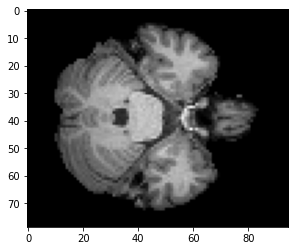

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


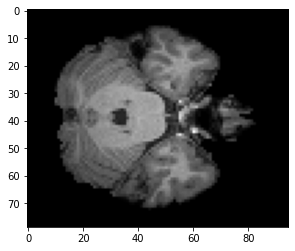

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


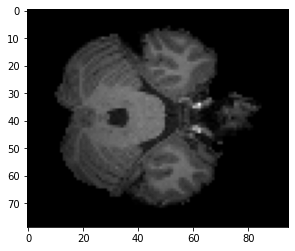

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


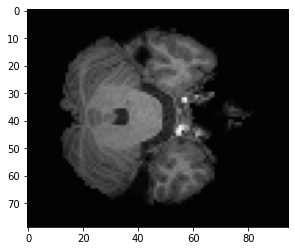

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


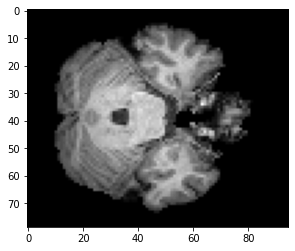

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


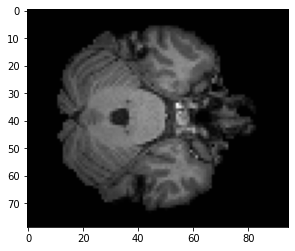

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


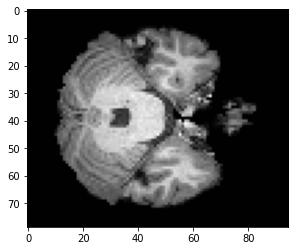

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


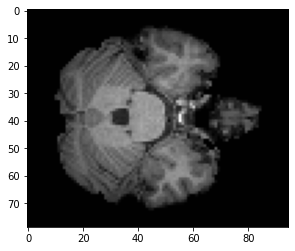

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


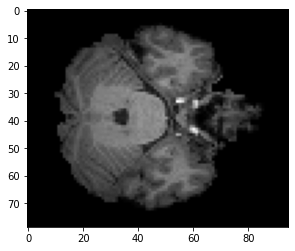

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


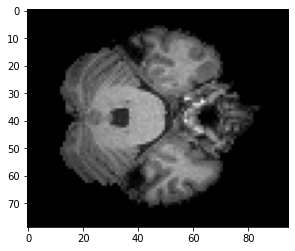

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


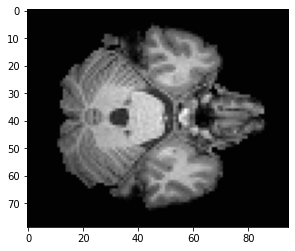

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


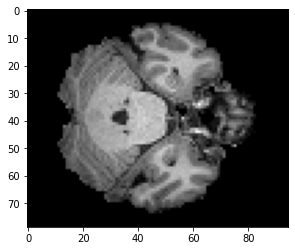

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


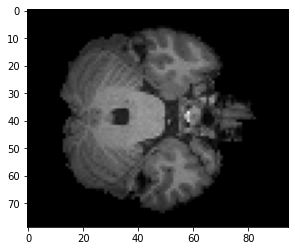

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


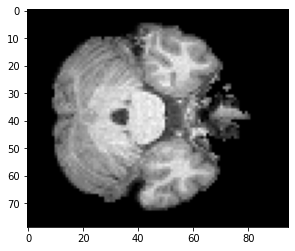

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


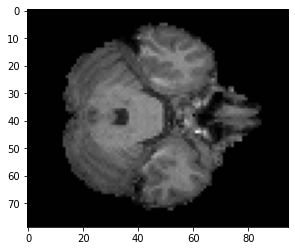

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


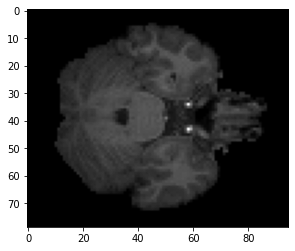

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


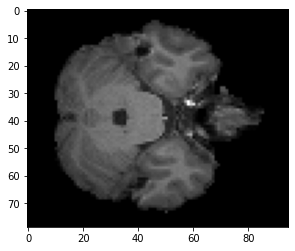

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


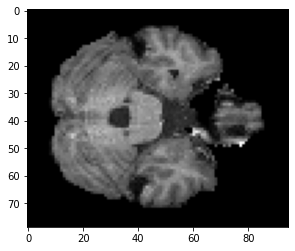

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


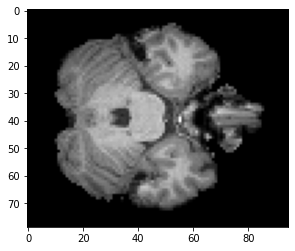

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


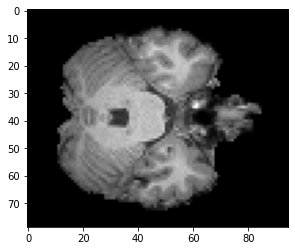

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


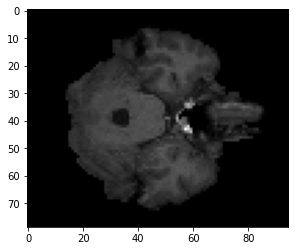

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


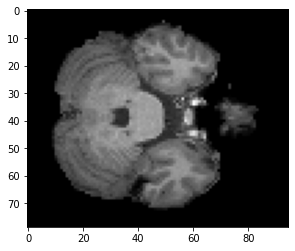

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


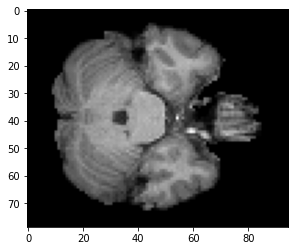

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


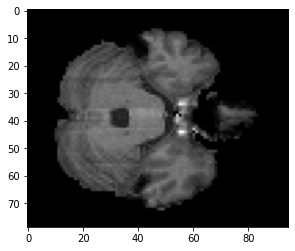

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


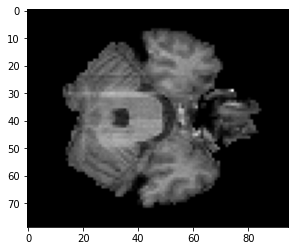

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


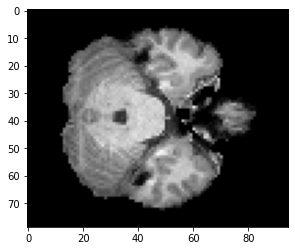

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


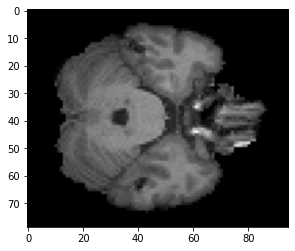

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


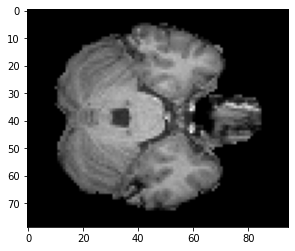

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


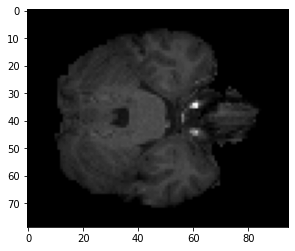

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


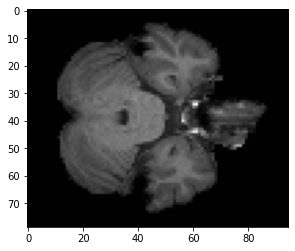

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


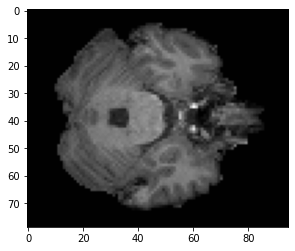

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


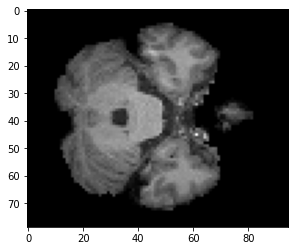

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


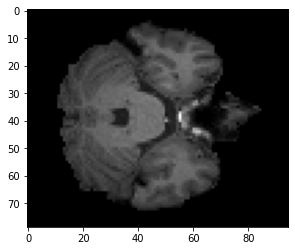

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


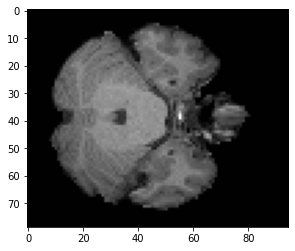

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


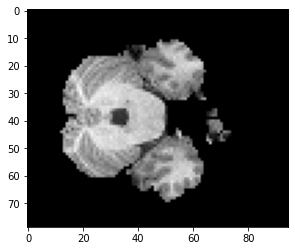

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


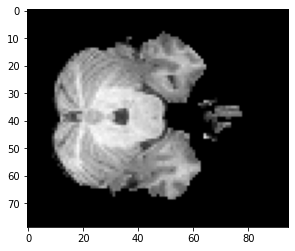

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


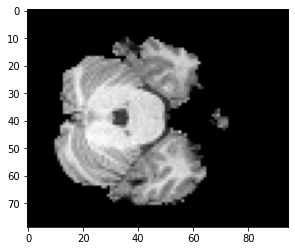

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


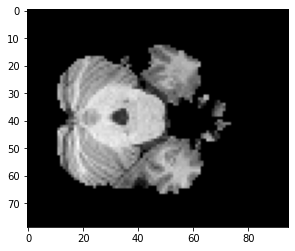

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


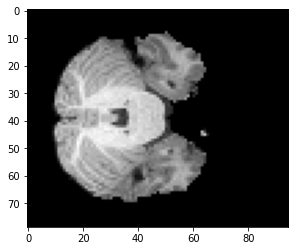

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


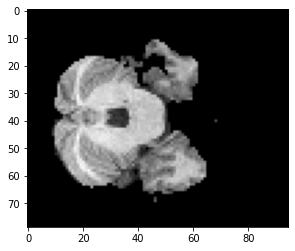

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


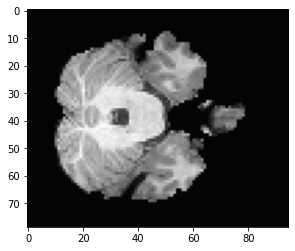

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


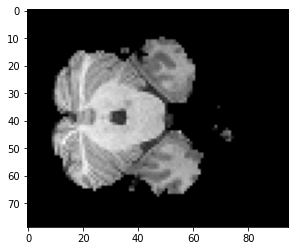

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


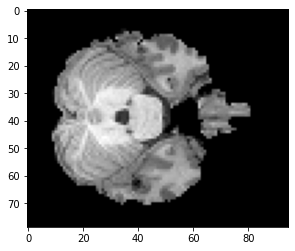

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


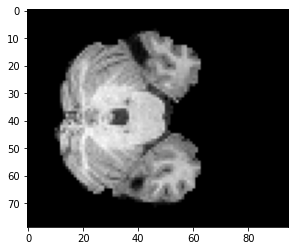

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


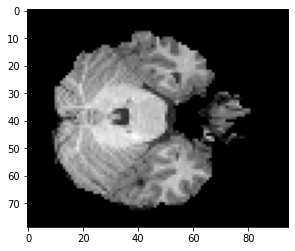

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


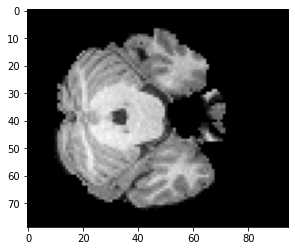

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


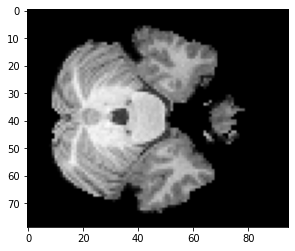

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


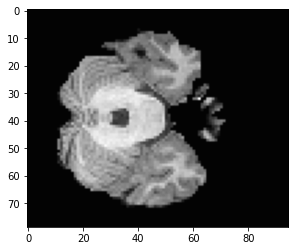

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


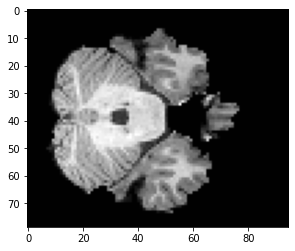

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


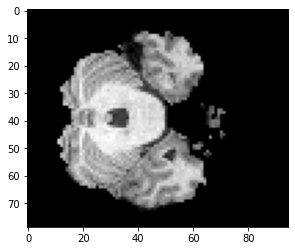

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


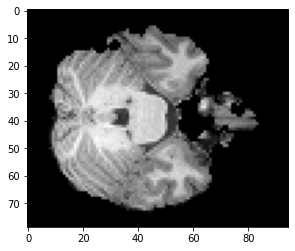

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


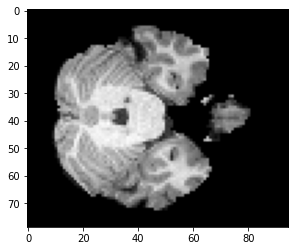

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


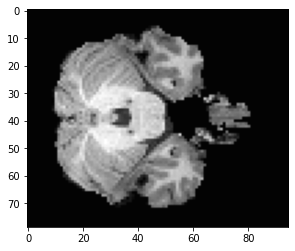

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


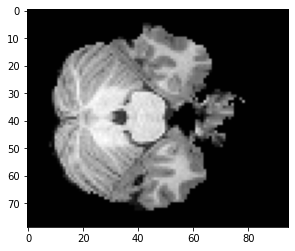

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


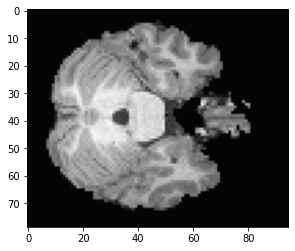

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


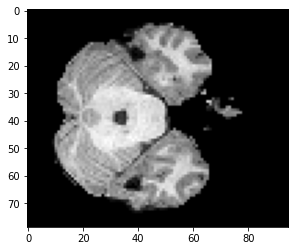

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


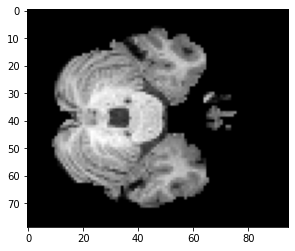

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


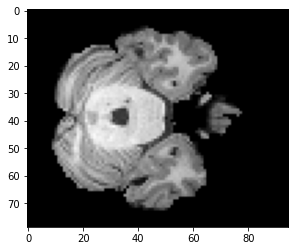

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


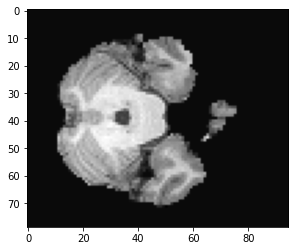

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


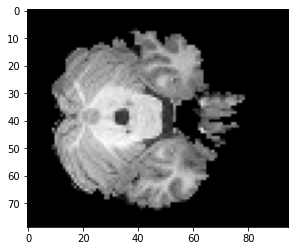

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


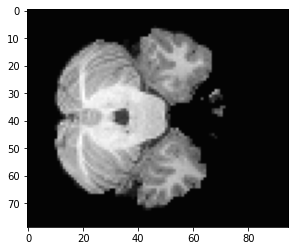

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


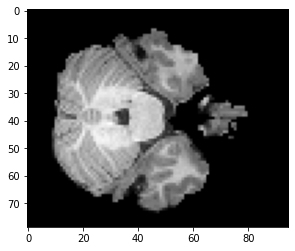

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


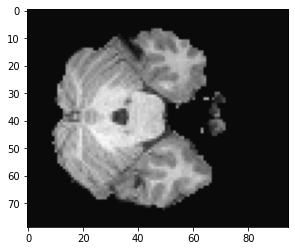

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


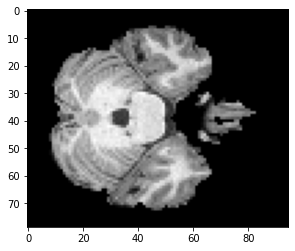

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


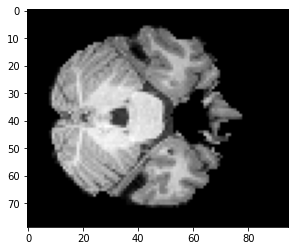

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


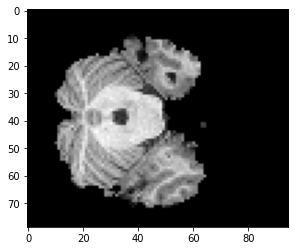

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


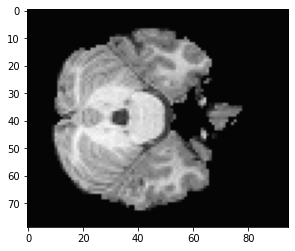

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


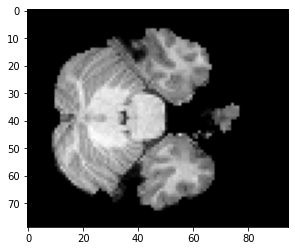

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


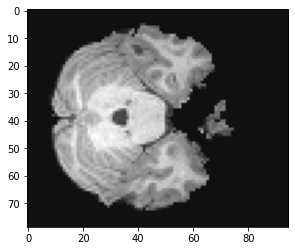

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


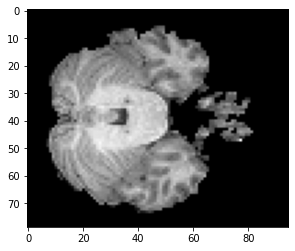

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


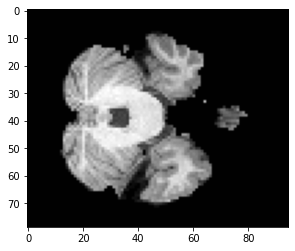

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


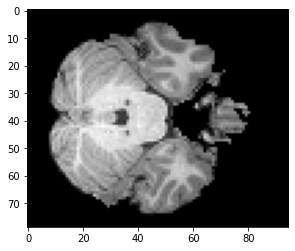

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


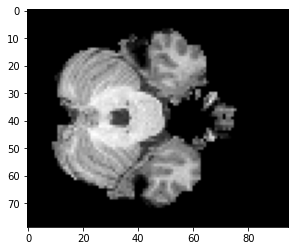

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


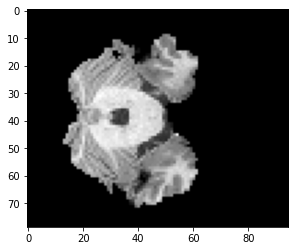

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


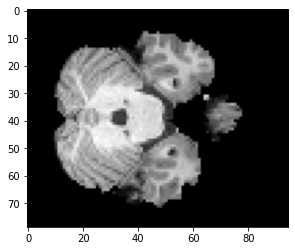

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


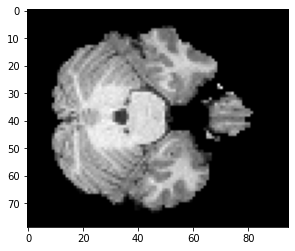

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


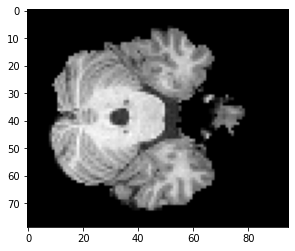

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


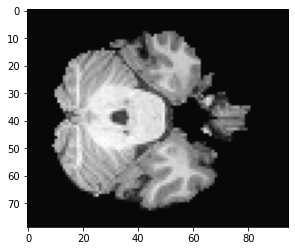

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


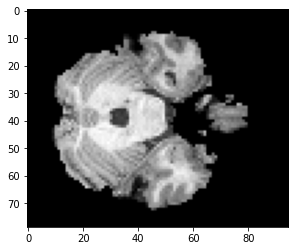

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


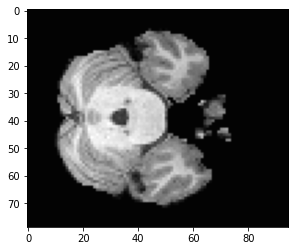

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


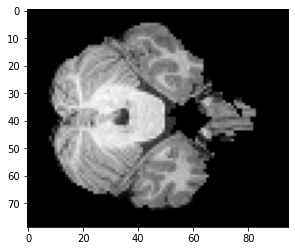

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


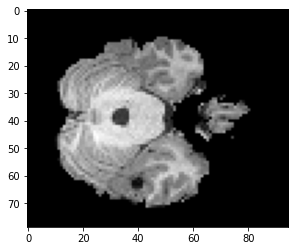

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


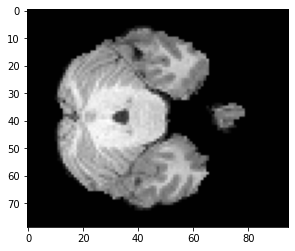

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


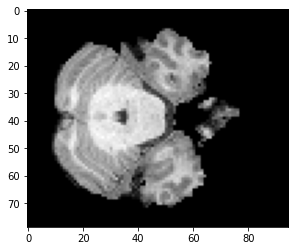

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


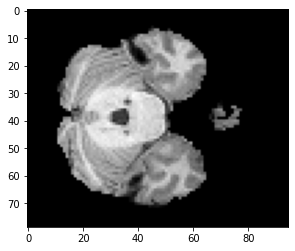

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


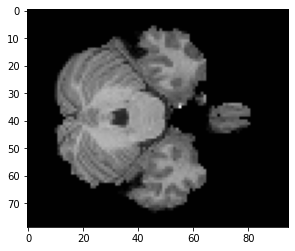

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


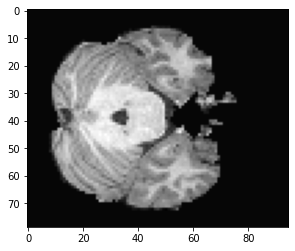

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


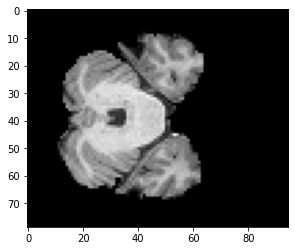

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


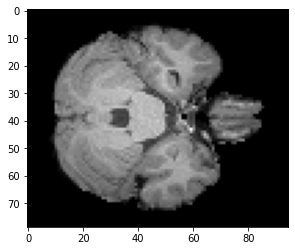

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


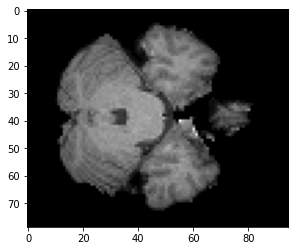

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


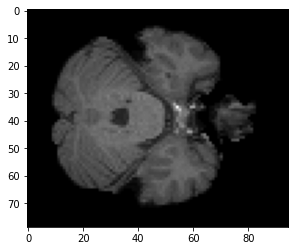

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


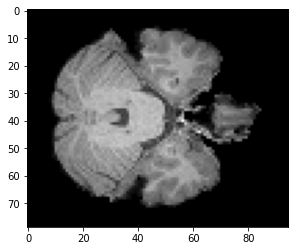

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


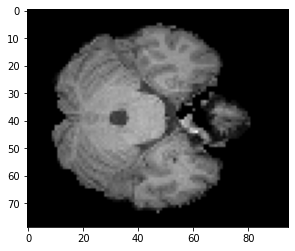

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


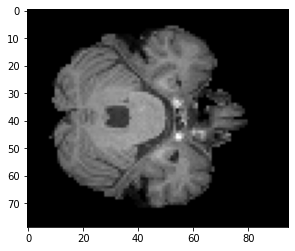

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


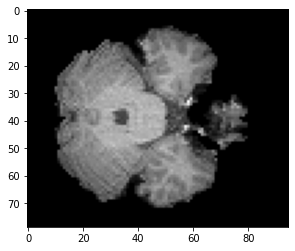

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


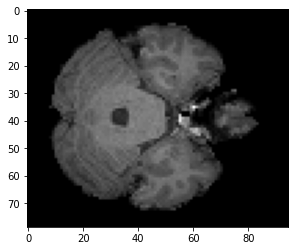

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


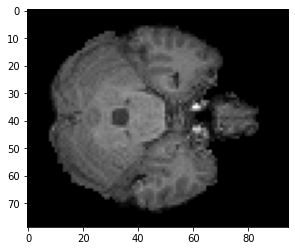

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


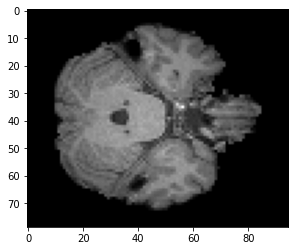

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


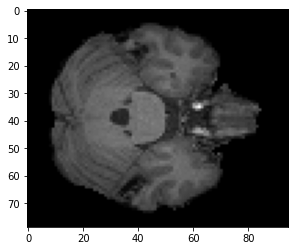

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


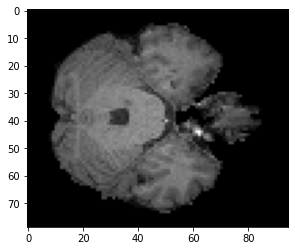

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


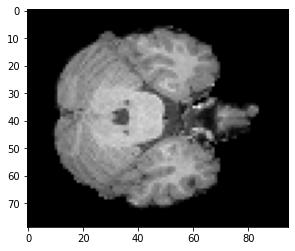

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


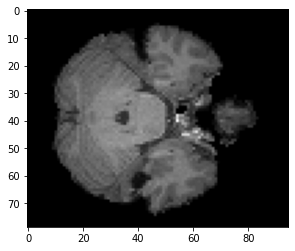

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


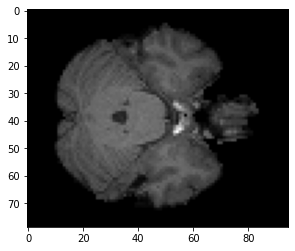

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


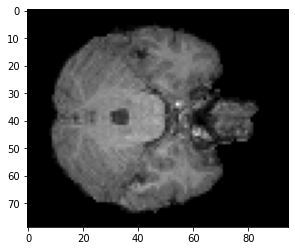

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


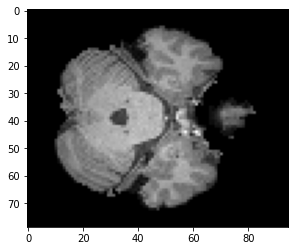

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


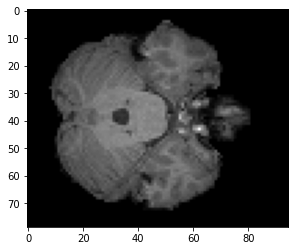

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


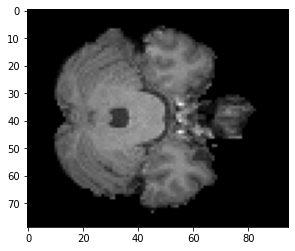

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


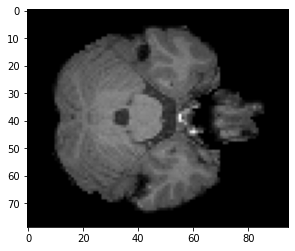

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


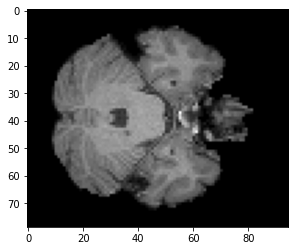

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


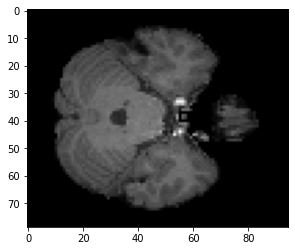

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


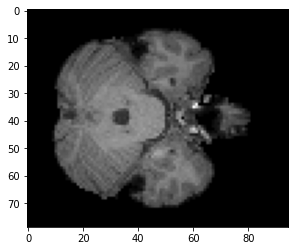

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


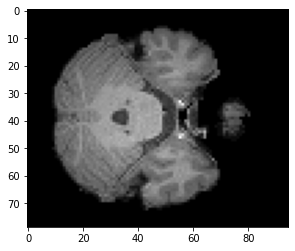

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


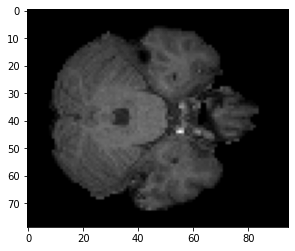

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


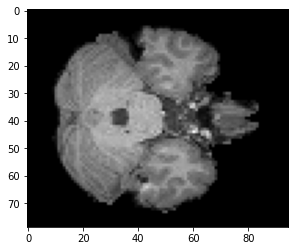

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


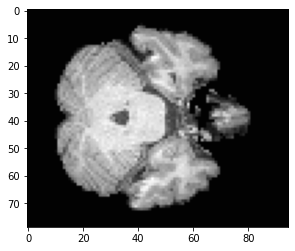

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


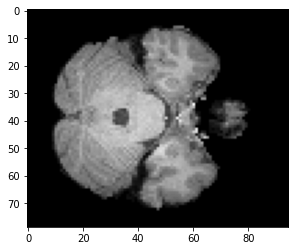

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


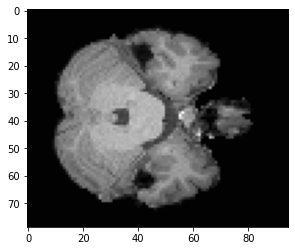

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


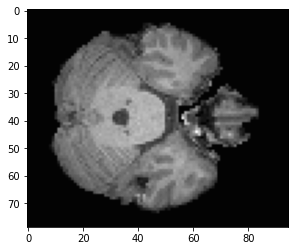

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


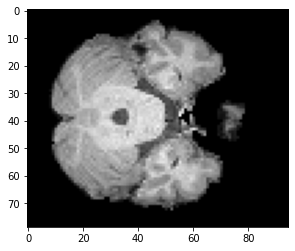

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


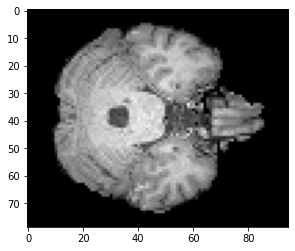

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


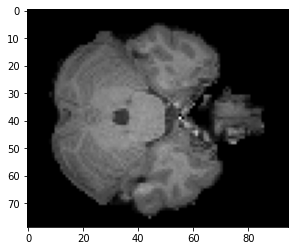

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


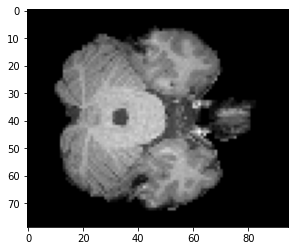

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


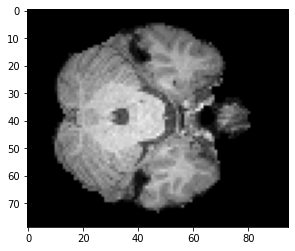

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


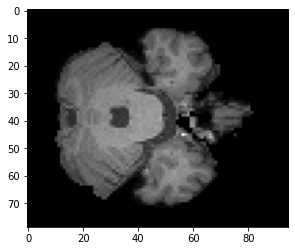

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


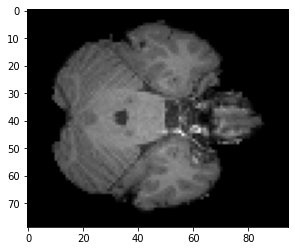

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


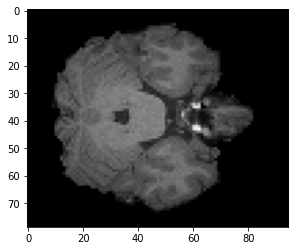

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


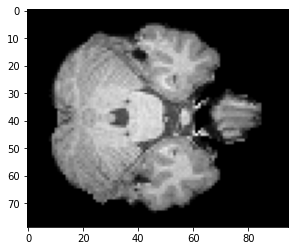

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


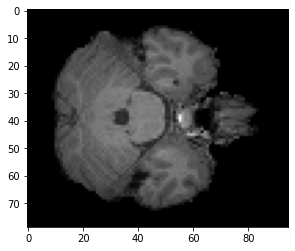

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


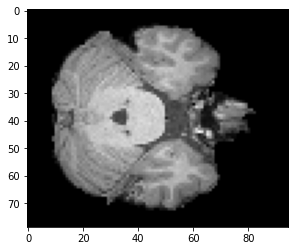

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


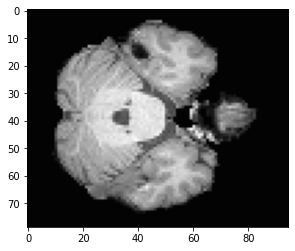

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


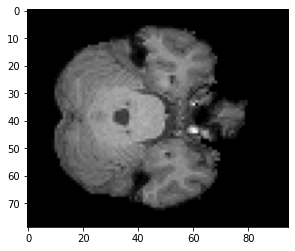

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


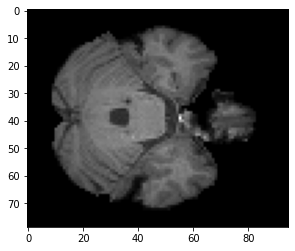

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


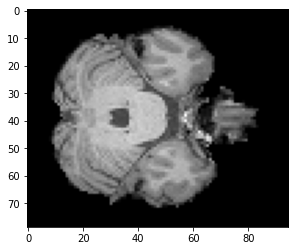

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


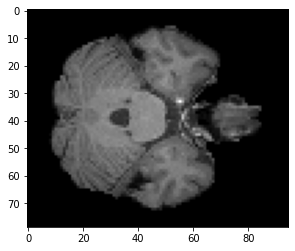

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


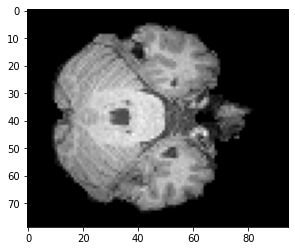

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


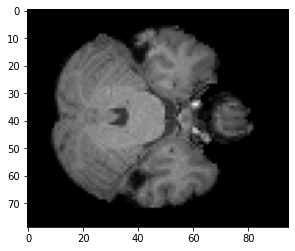

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


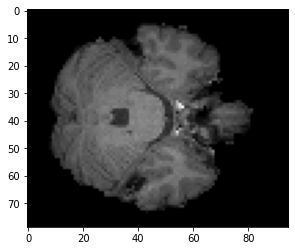

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


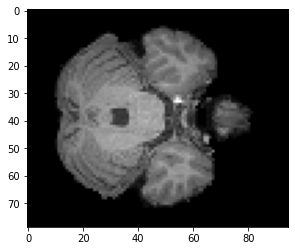

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


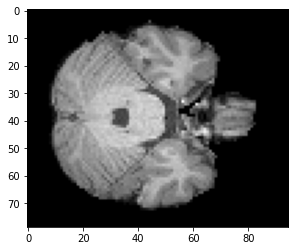

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


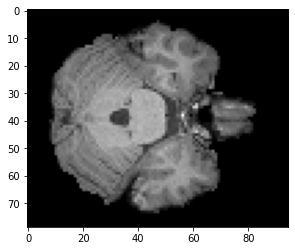

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


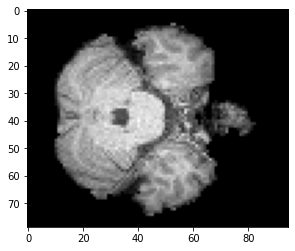

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


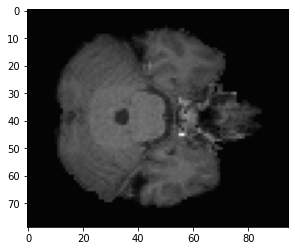

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


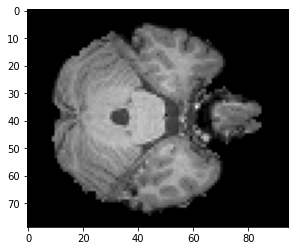

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


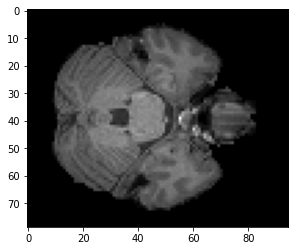

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


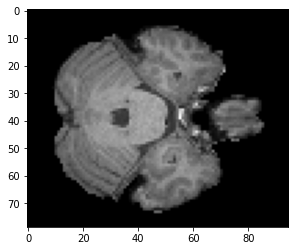

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


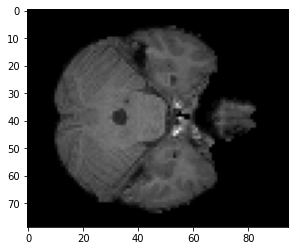

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


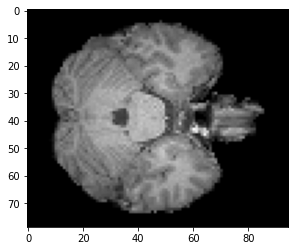

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


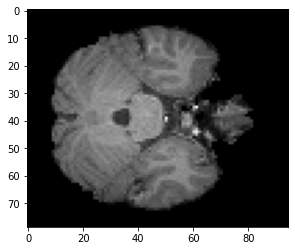

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


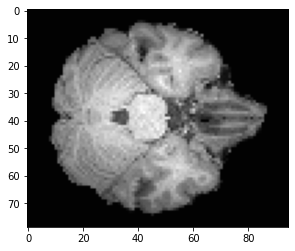

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


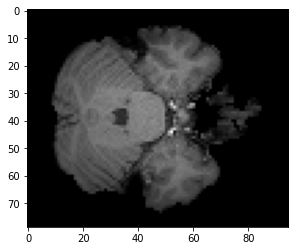

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


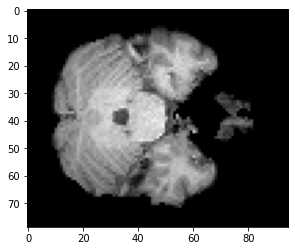

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


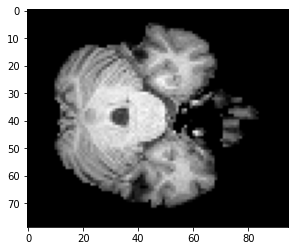

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


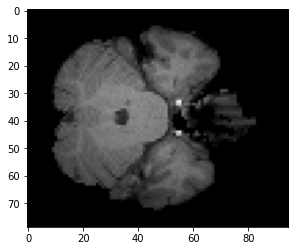

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


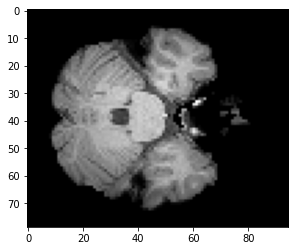

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


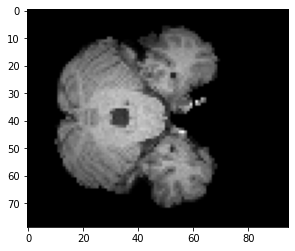

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


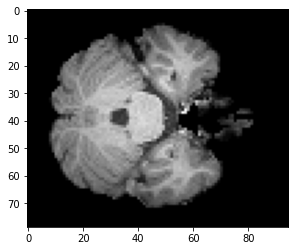

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


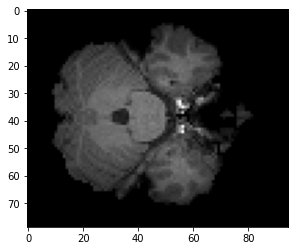

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


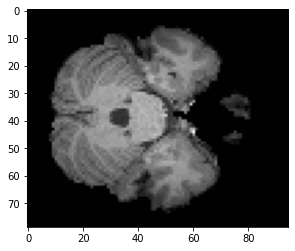

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


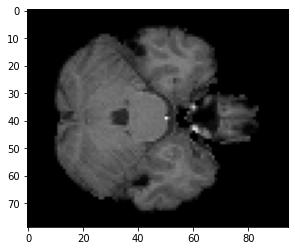

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


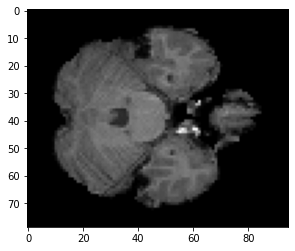

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


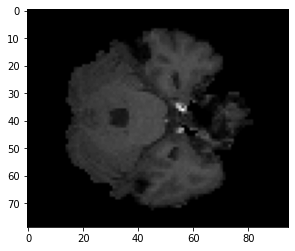

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


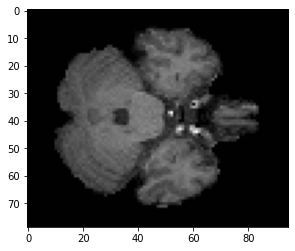

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


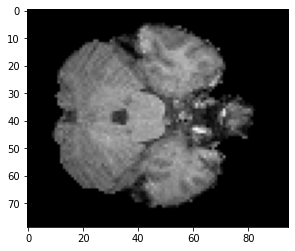

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


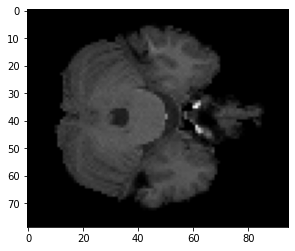

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


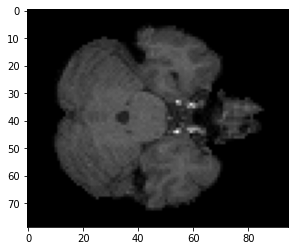

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


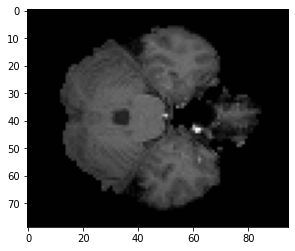

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


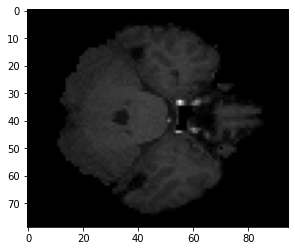

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


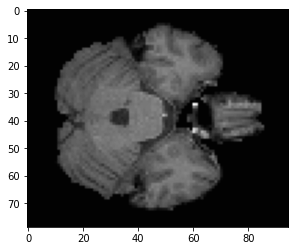

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


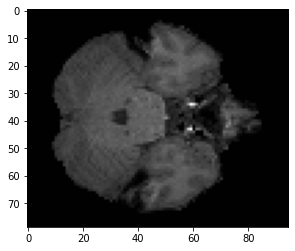

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


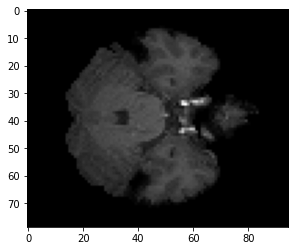

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


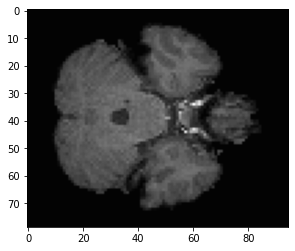

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


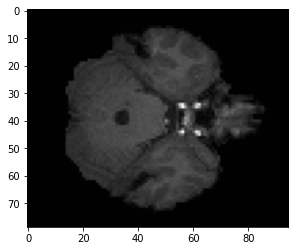

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


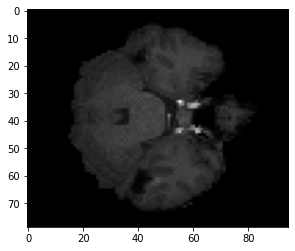

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


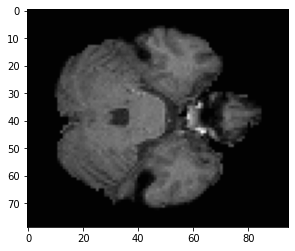

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


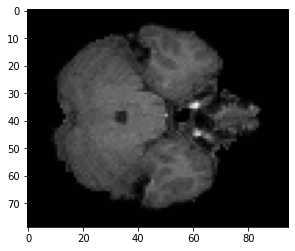

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


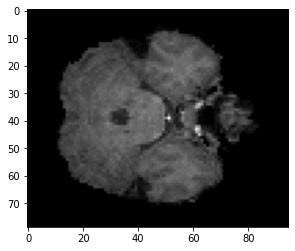

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


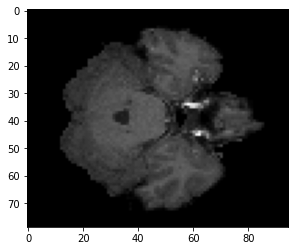

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


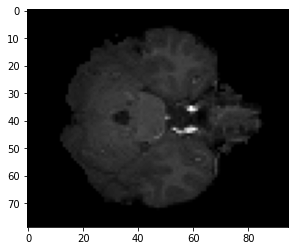

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


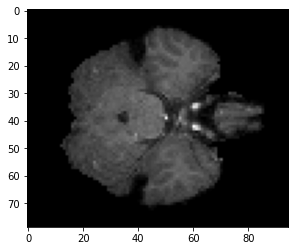

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


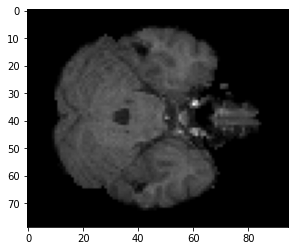

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


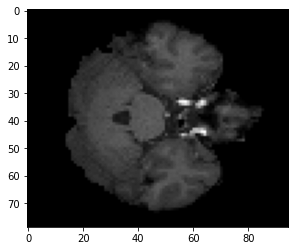

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


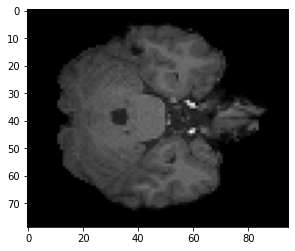

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


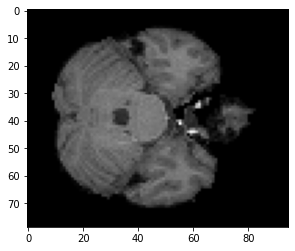

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


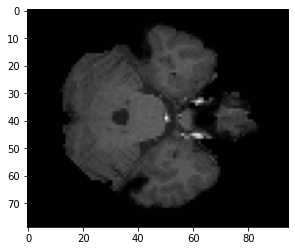

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


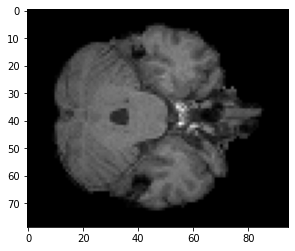

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


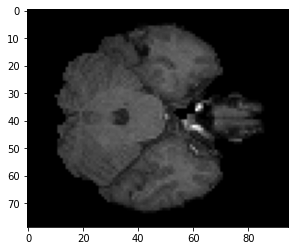

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


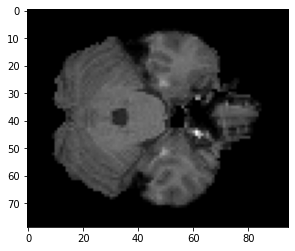

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


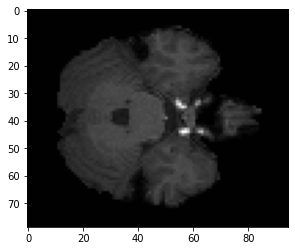

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


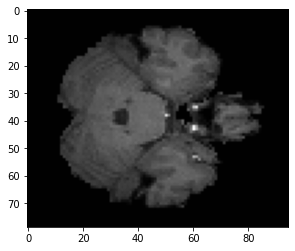

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


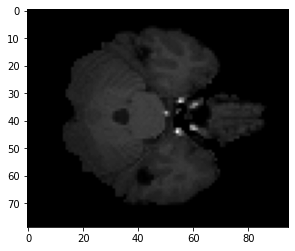

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


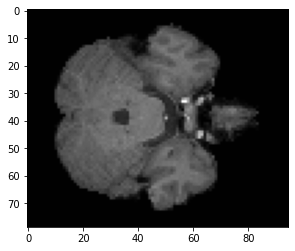

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


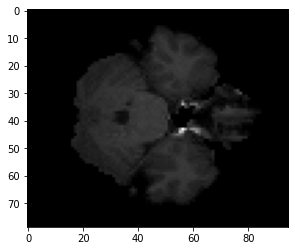

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


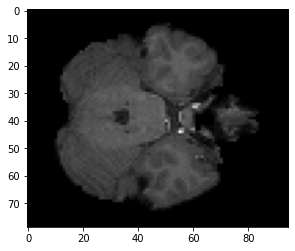

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


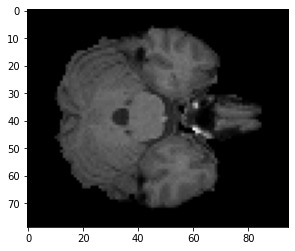

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


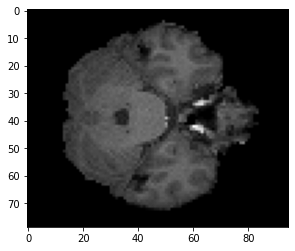

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


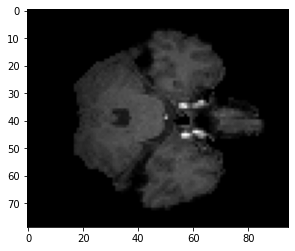

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


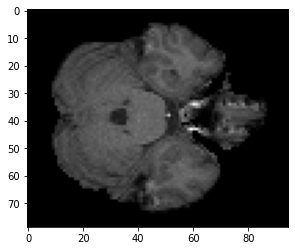

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


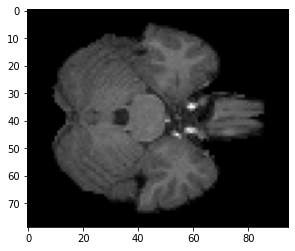

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


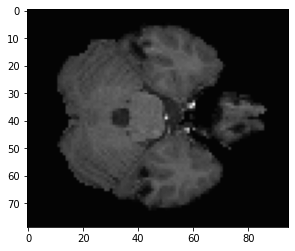

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


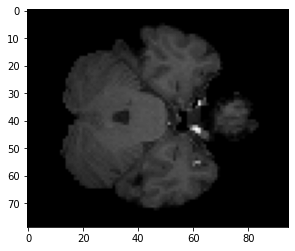

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


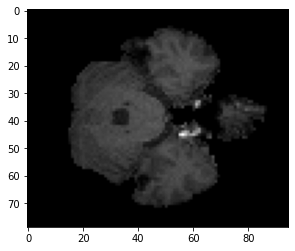

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


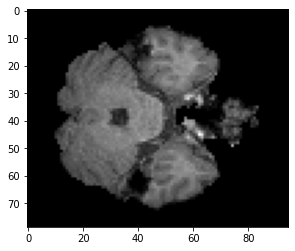

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


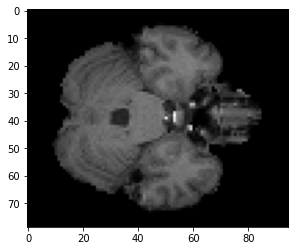

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


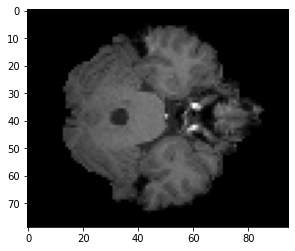

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


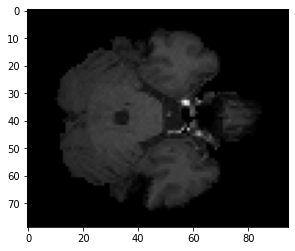

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


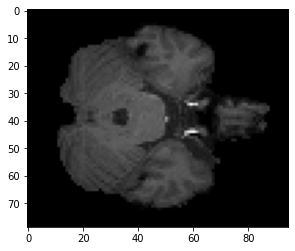

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


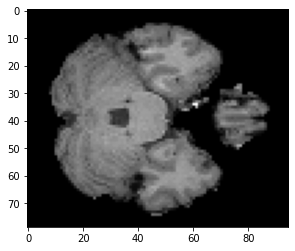

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


In [12]:
categories = ['cat0']

for category in categories:
    for name in imagenames_with_categories[category]:
        # Load the image
        img = nib.load(name)

        # Get the data from the image
        data = img.get_fdata()

        # Display the image using matplotlib
        plt.imshow(data[:, :, 20], cmap='gray')
        plt.show()

        # Get the header information
        header = img.header

        # Get the intensity information
        intensity = header.get_data_dtype()

        # Get the dimension information
        dimension = header.get_data_shape()

        # Get the slice thickness information
        slice_thickness = header['pixdim'][3]

        # Get the slice gap information
        slice_gap = header['pixdim'][4]

        # Get the voxel resolution information
        voxel_resolution = header['pixdim'][1:4]

        # Print the information
        print("Intensity:", intensity)
        print("Dimension:", dimension)
        print("Slice Thickness:", slice_thickness)
        print("Slice Gap:", slice_gap)
        print("Voxel Resolution:", voxel_resolution)


 # Visualization of unhealthy  images from category 1 to 7

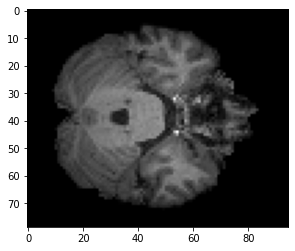

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


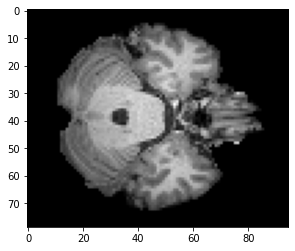

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


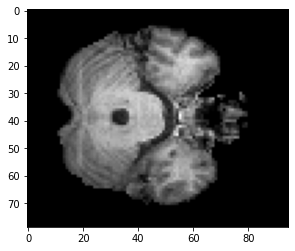

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


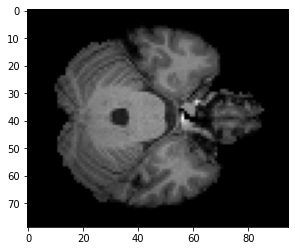

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


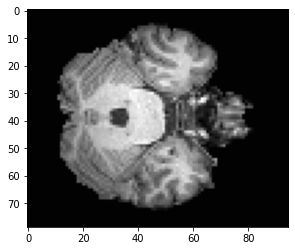

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


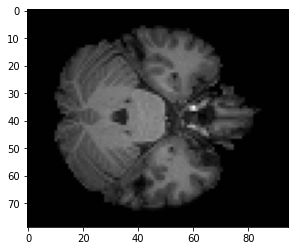

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


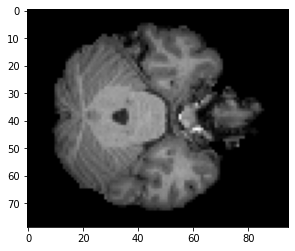

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


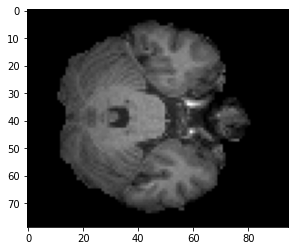

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


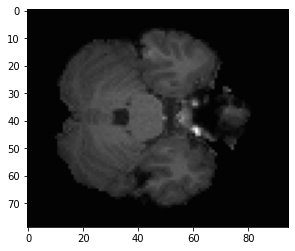

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


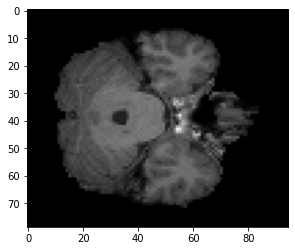

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


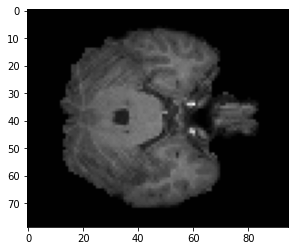

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


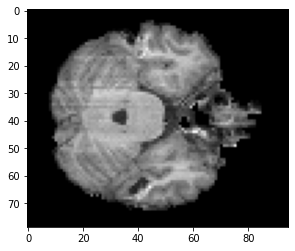

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


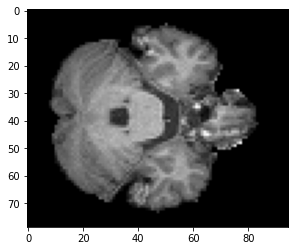

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


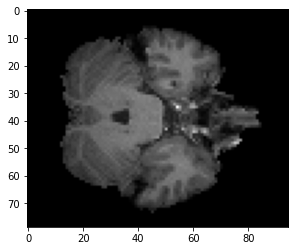

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


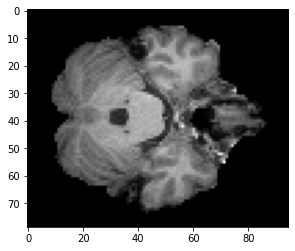

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


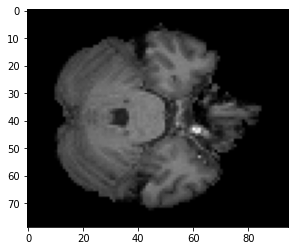

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


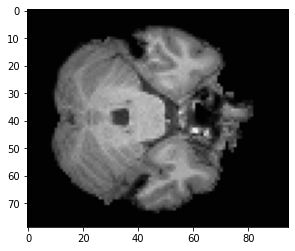

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


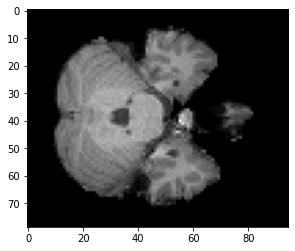

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


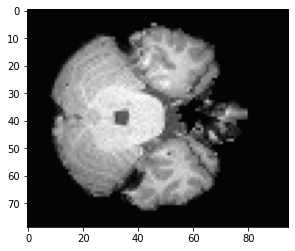

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


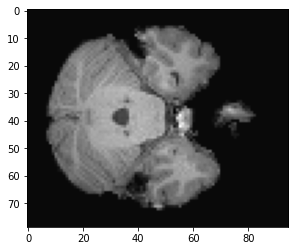

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


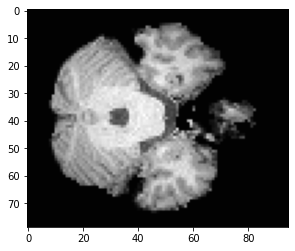

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


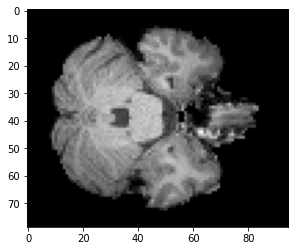

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


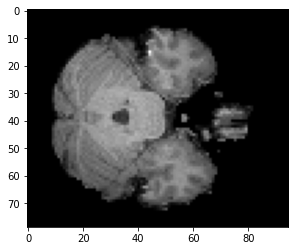

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


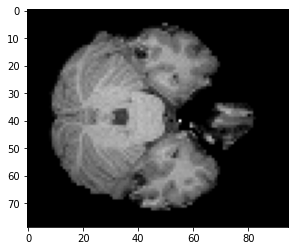

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


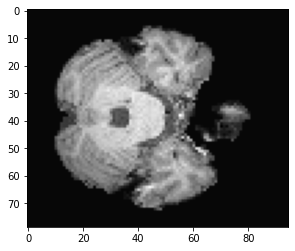

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


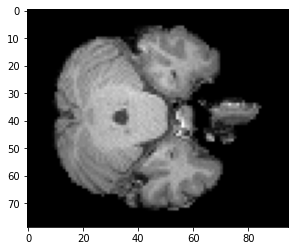

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


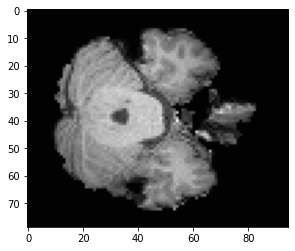

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


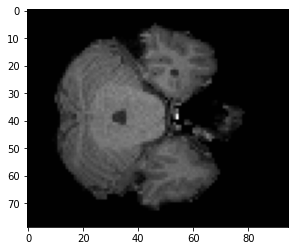

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


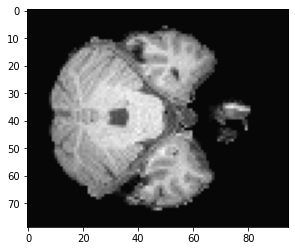

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


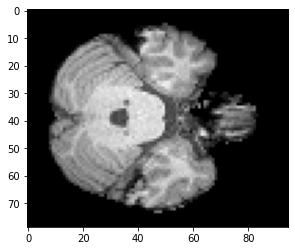

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


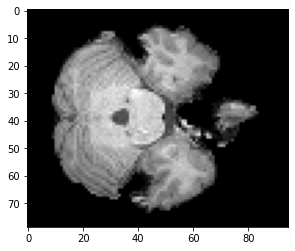

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


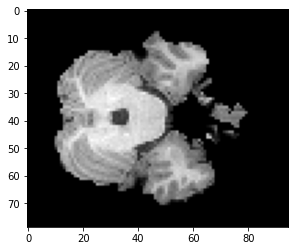

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


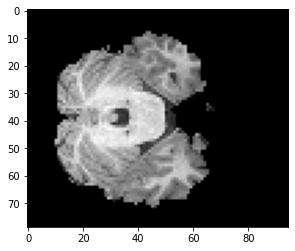

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


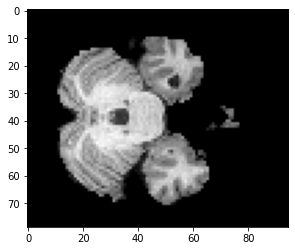

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


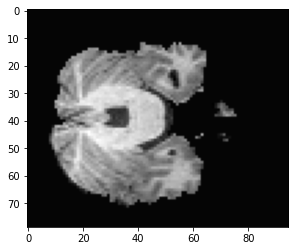

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


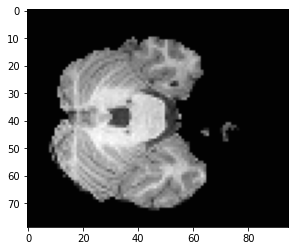

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


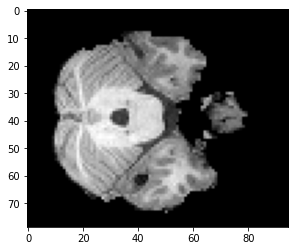

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


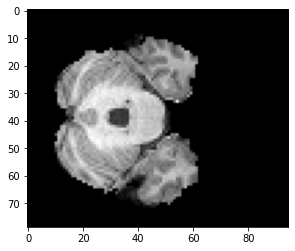

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


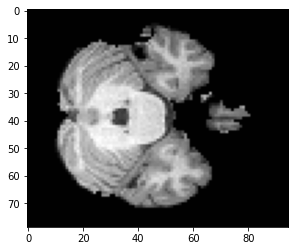

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


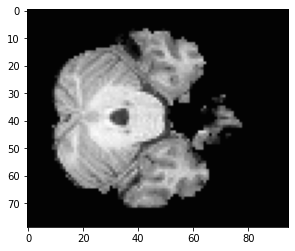

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


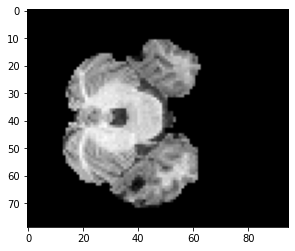

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


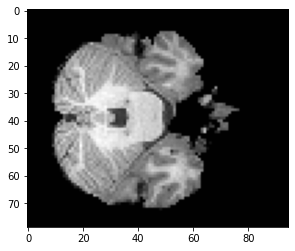

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


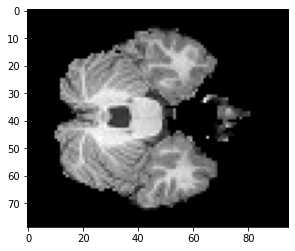

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


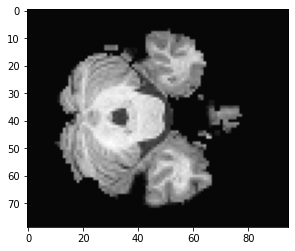

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


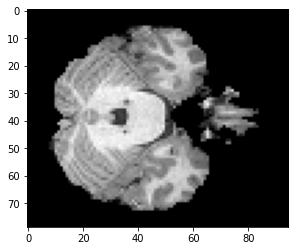

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


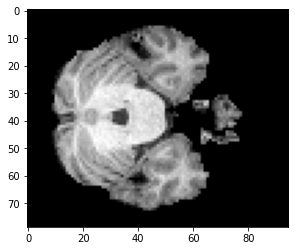

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


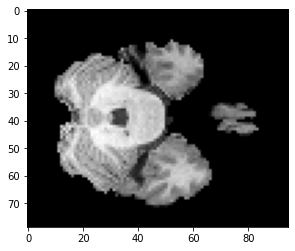

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


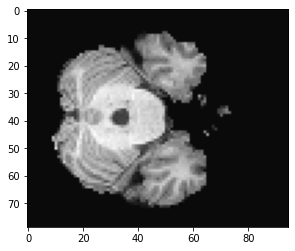

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


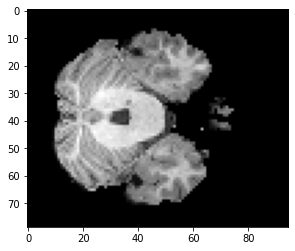

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


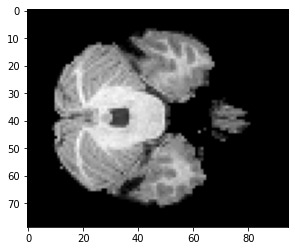

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


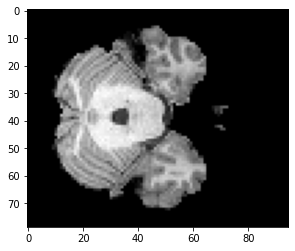

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


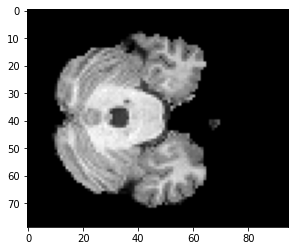

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


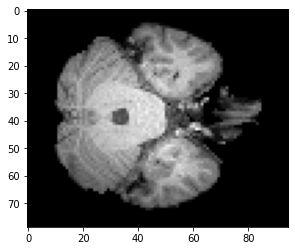

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


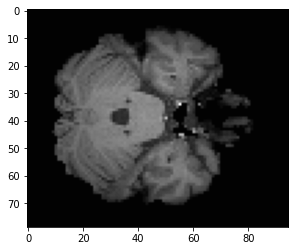

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


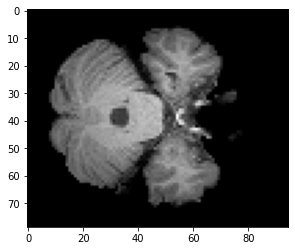

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


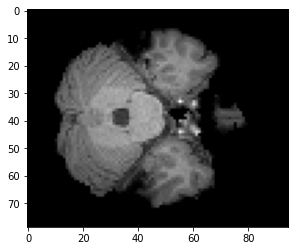

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


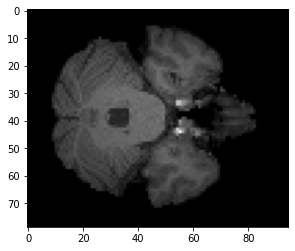

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


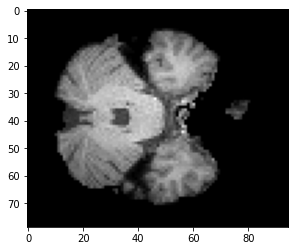

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


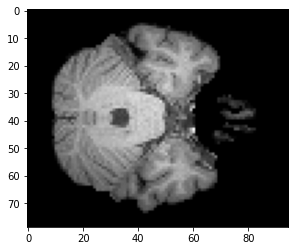

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


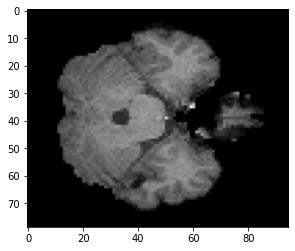

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


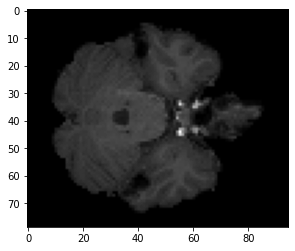

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


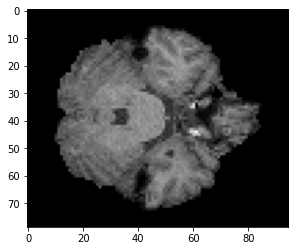

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


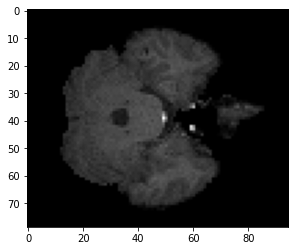

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


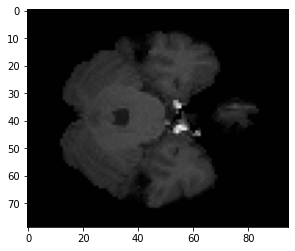

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


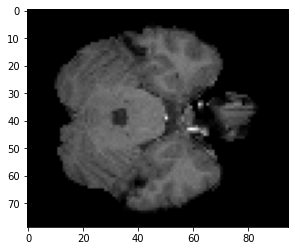

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


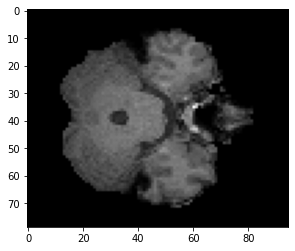

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


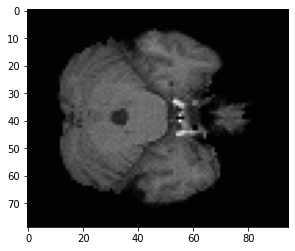

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


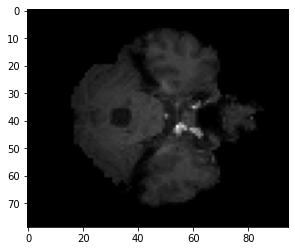

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


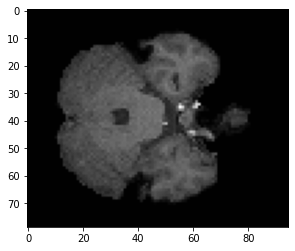

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


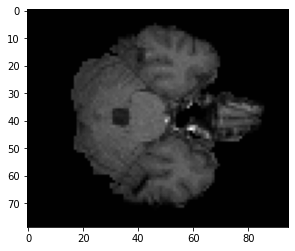

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


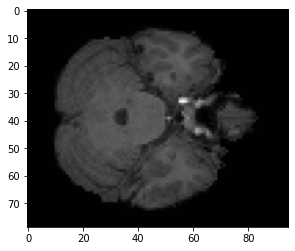

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


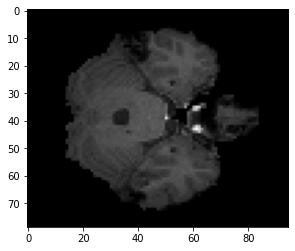

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


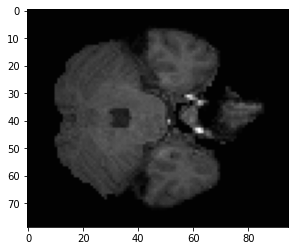

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


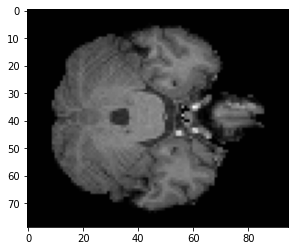

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


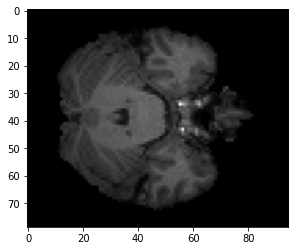

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


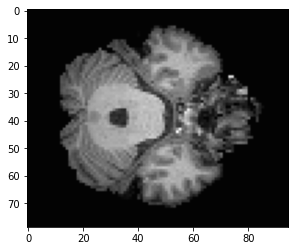

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


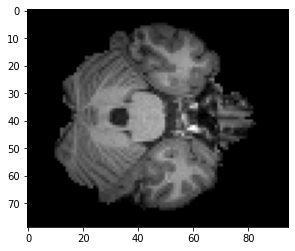

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


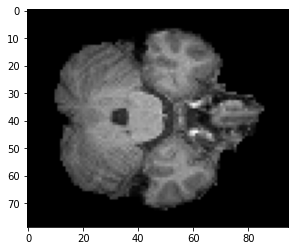

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


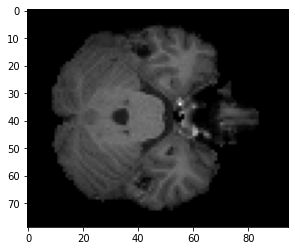

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


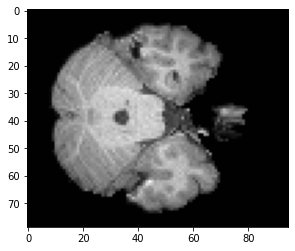

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


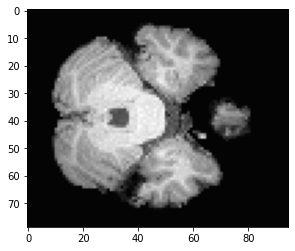

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


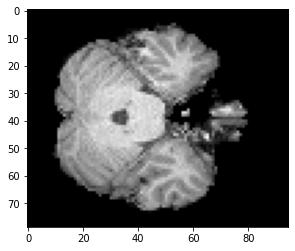

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


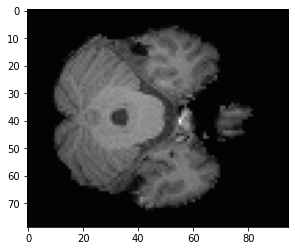

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


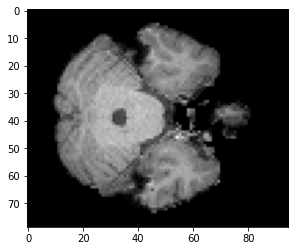

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


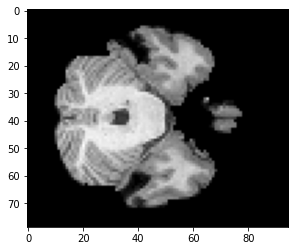

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


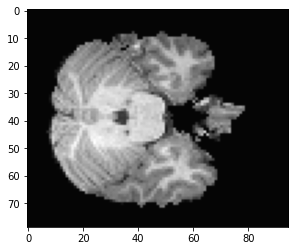

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


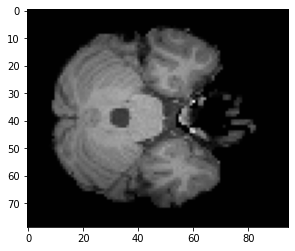

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


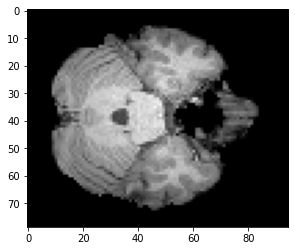

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


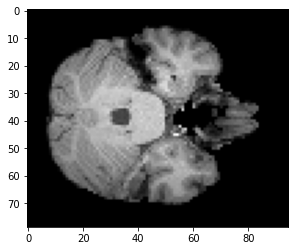

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


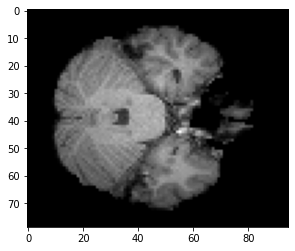

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


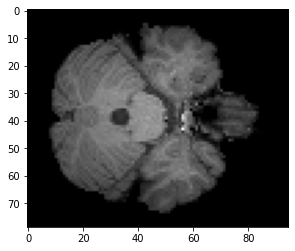

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


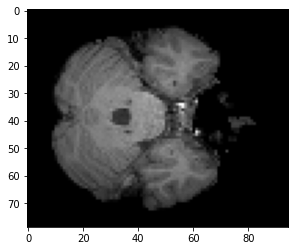

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


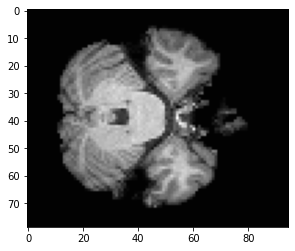

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


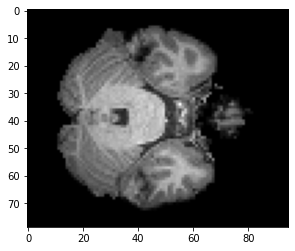

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


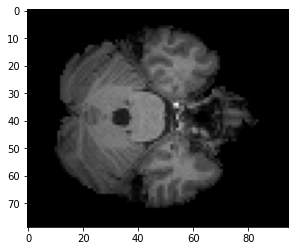

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


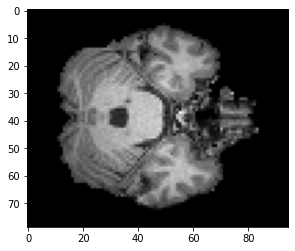

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


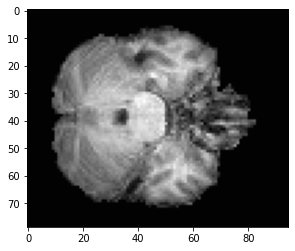

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


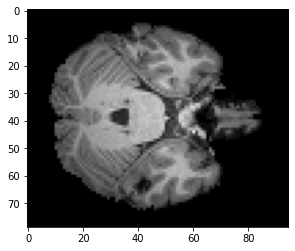

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


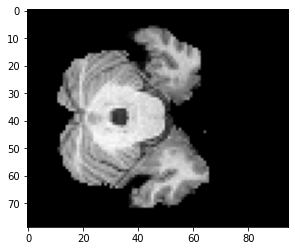

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


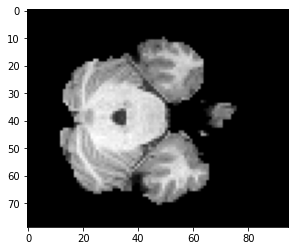

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


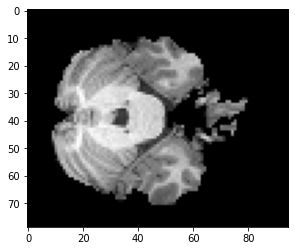

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


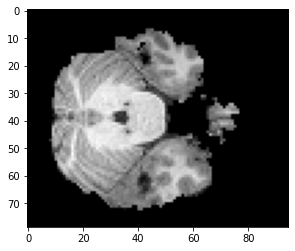

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


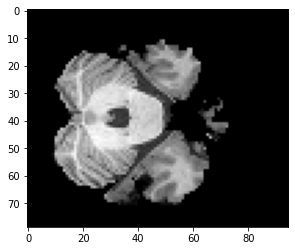

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


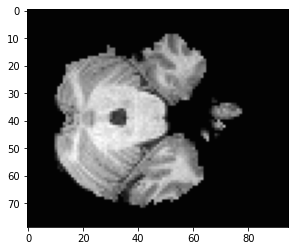

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


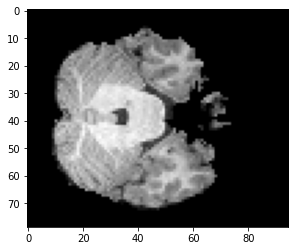

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


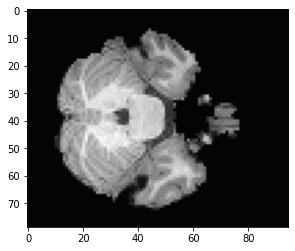

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


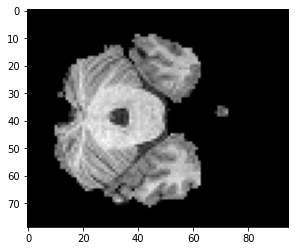

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


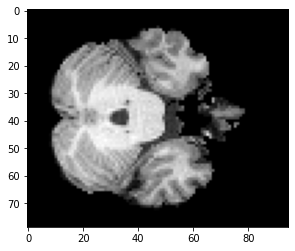

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


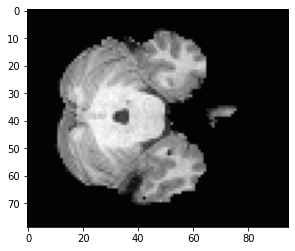

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


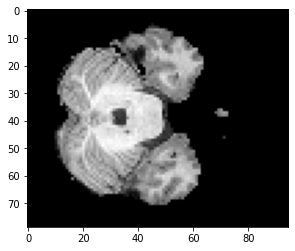

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


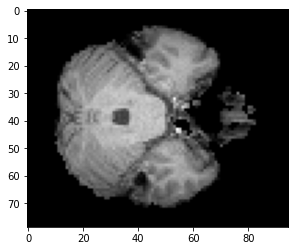

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


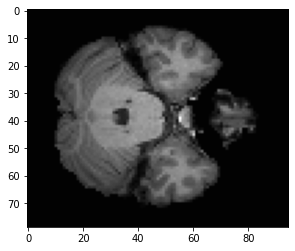

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


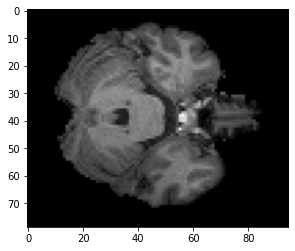

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


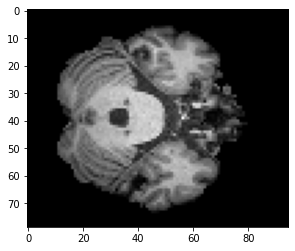

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


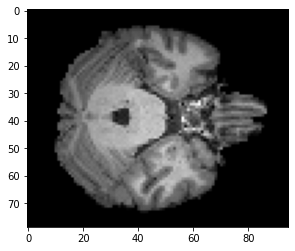

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


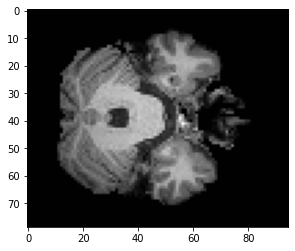

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


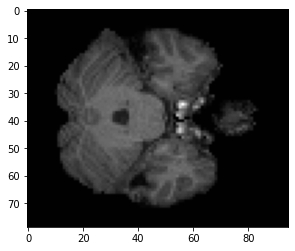

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


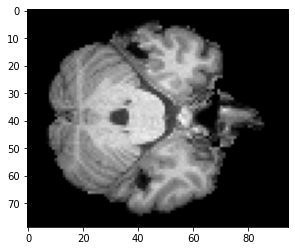

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


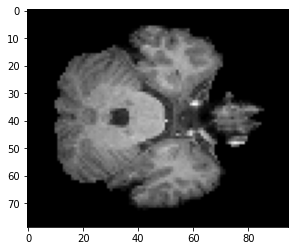

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


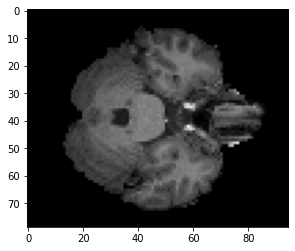

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


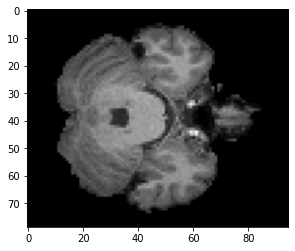

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


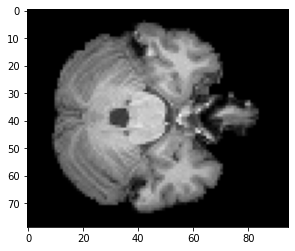

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


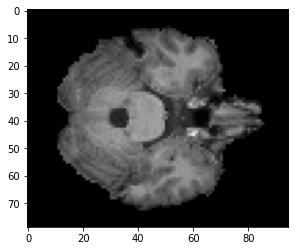

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


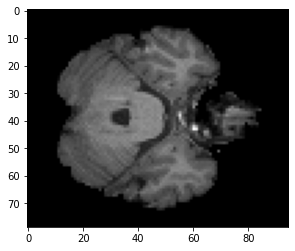

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


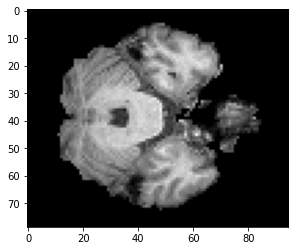

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


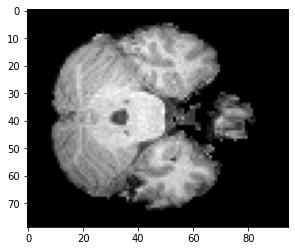

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


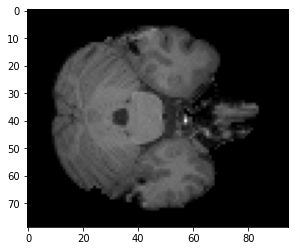

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


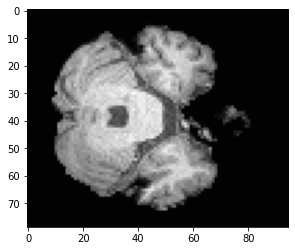

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


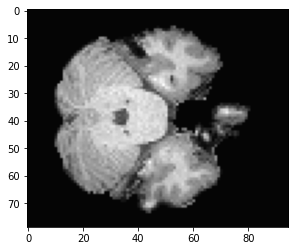

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


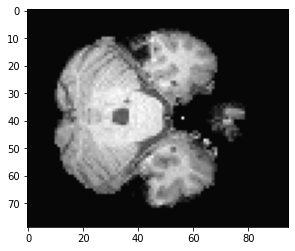

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


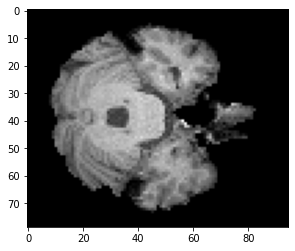

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


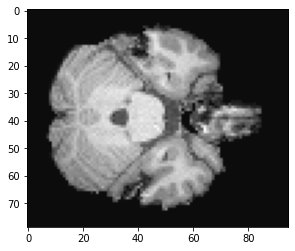

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


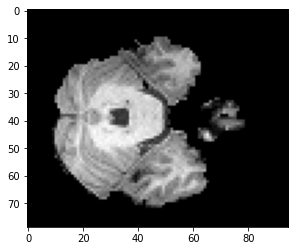

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


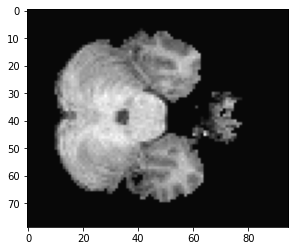

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


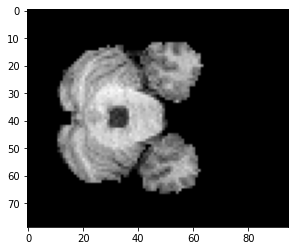

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


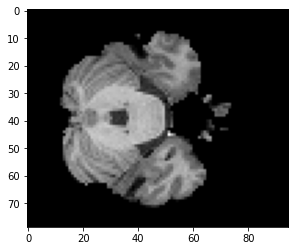

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


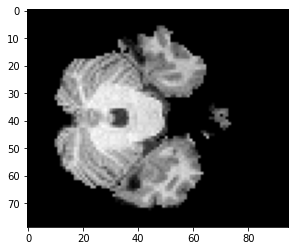

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


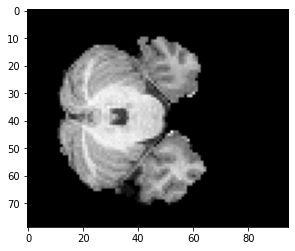

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


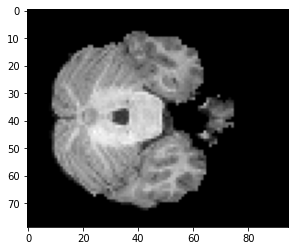

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


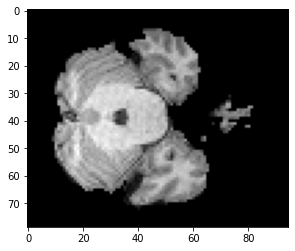

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


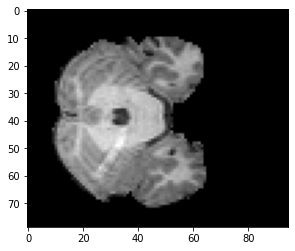

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


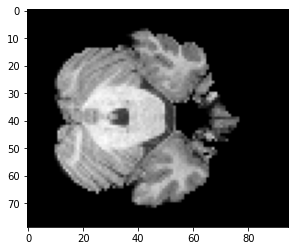

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


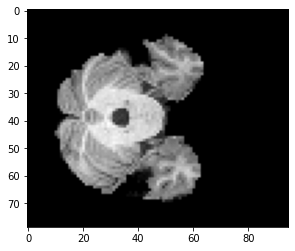

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


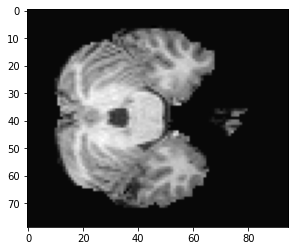

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


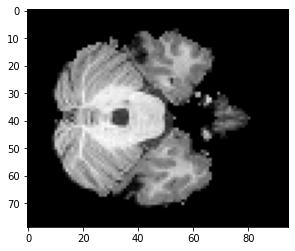

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


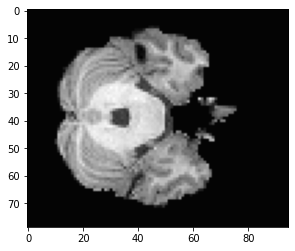

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


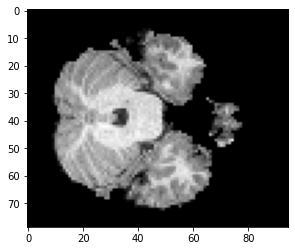

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


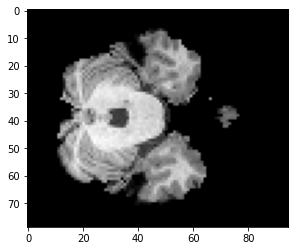

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


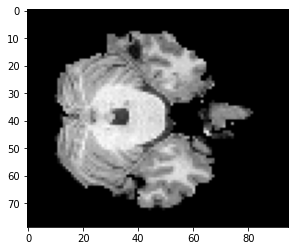

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


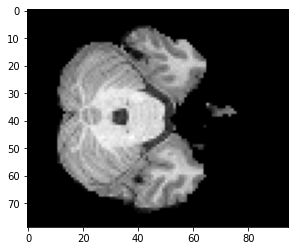

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


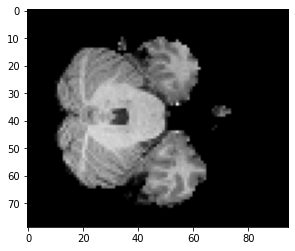

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


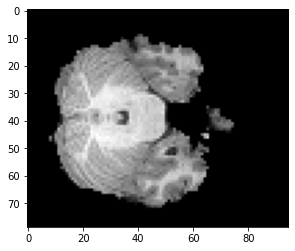

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


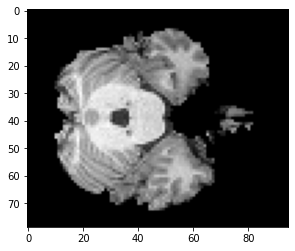

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


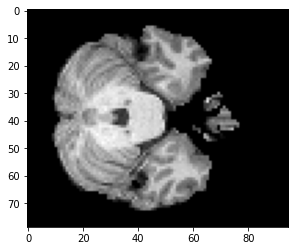

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


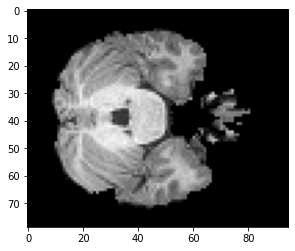

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


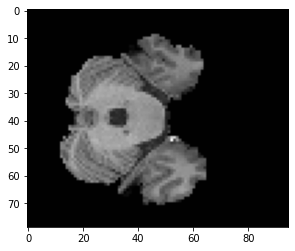

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


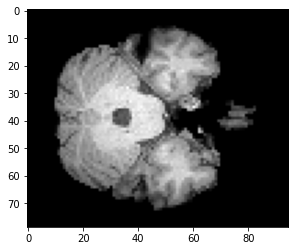

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


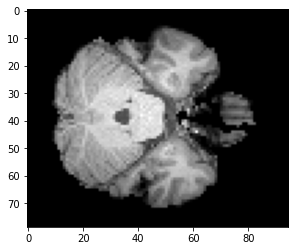

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


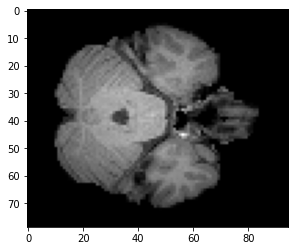

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


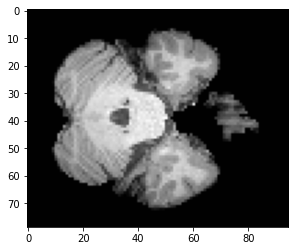

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


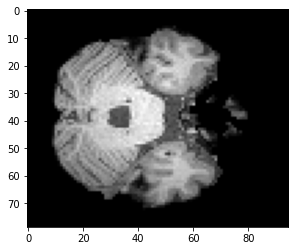

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


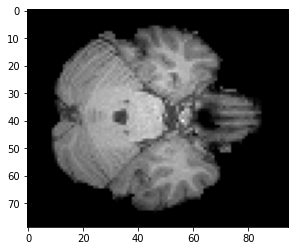

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


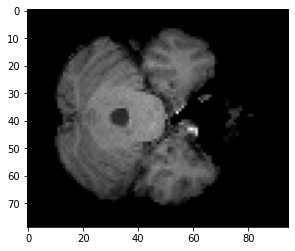

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


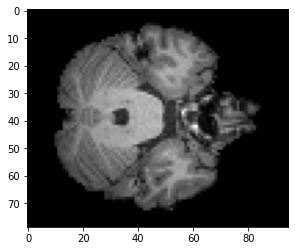

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


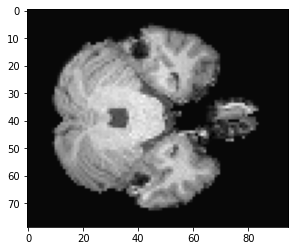

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


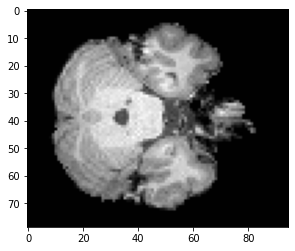

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


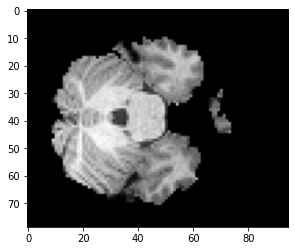

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


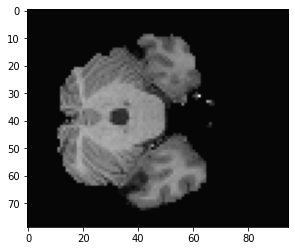

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


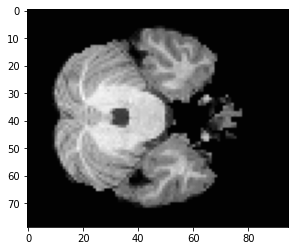

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


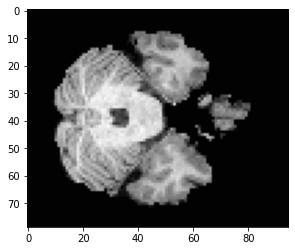

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


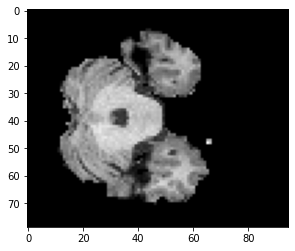

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


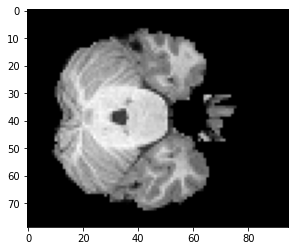

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


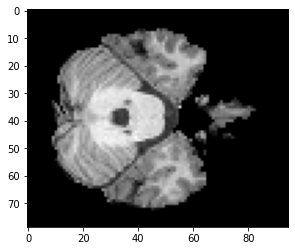

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


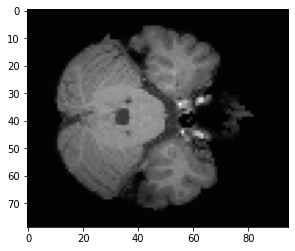

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


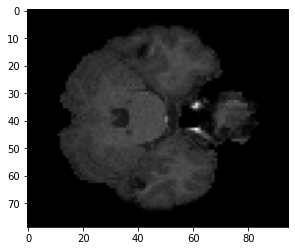

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


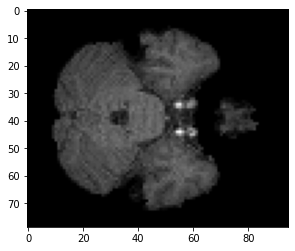

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


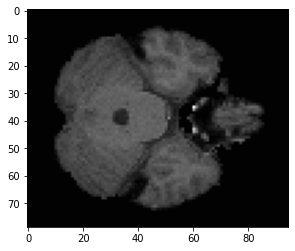

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


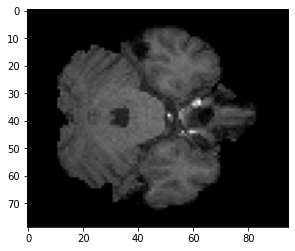

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


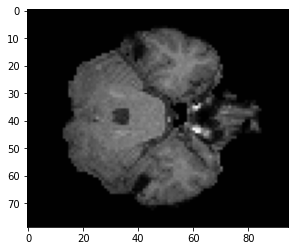

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


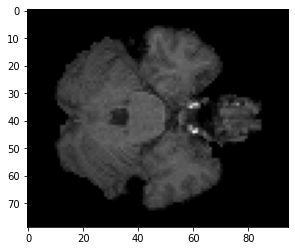

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


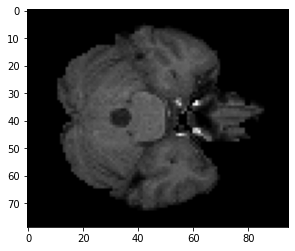

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


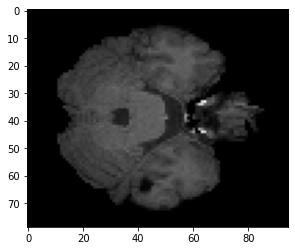

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


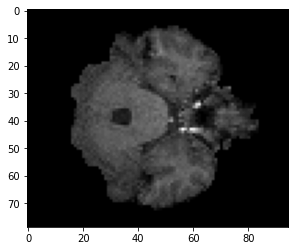

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


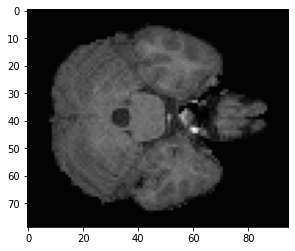

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


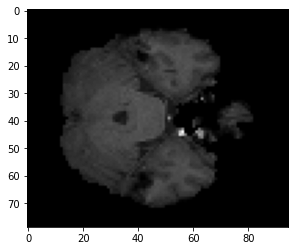

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


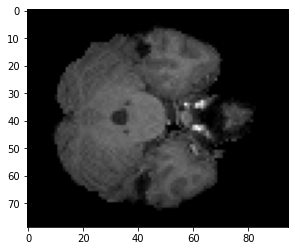

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


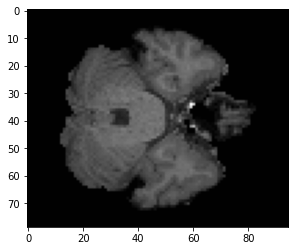

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


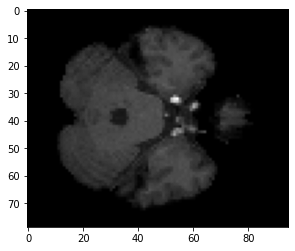

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


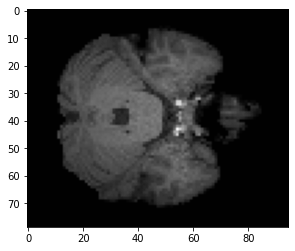

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


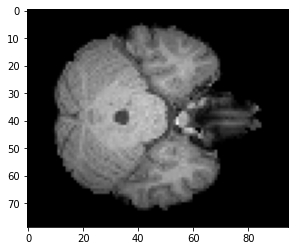

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


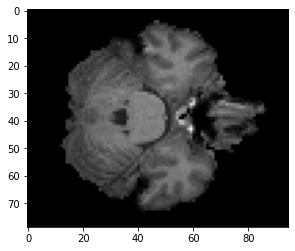

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


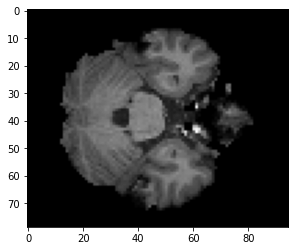

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


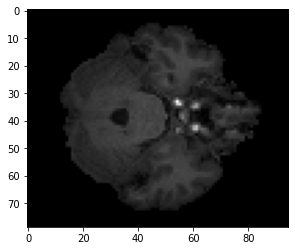

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


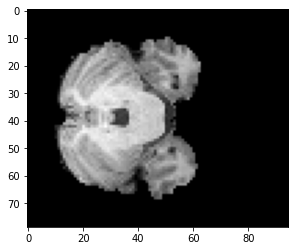

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


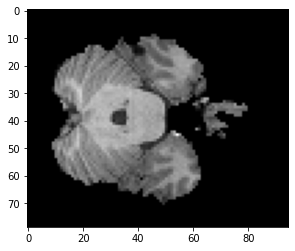

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


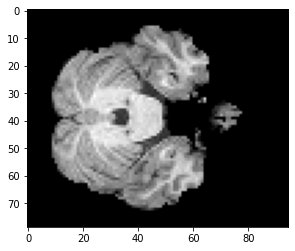

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


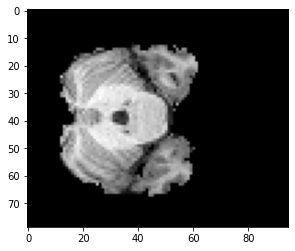

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


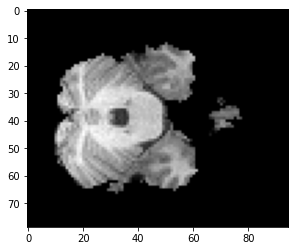

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


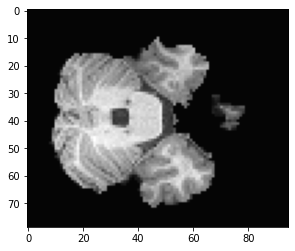

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


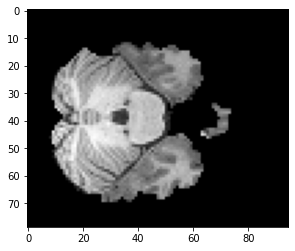

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


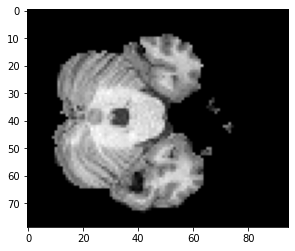

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


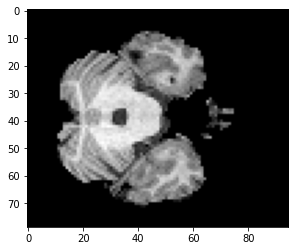

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


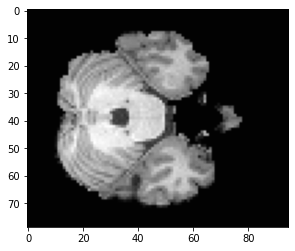

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


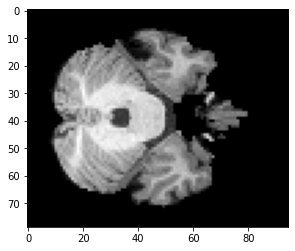

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


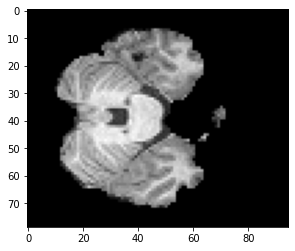

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


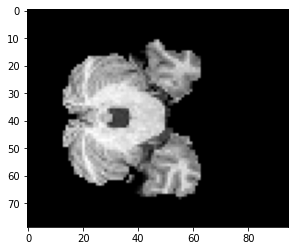

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


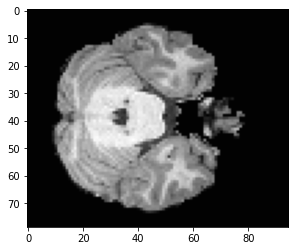

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


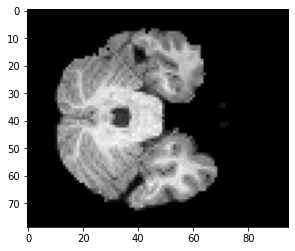

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


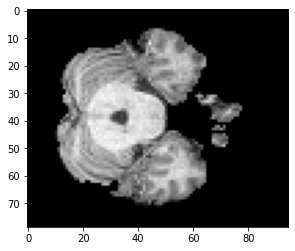

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


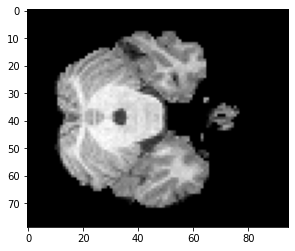

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


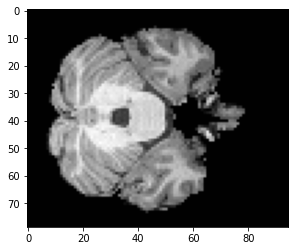

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


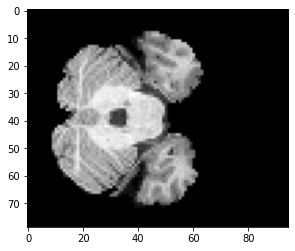

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


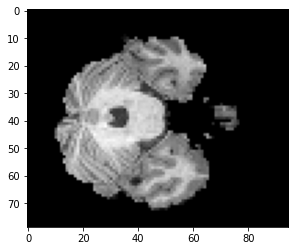

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


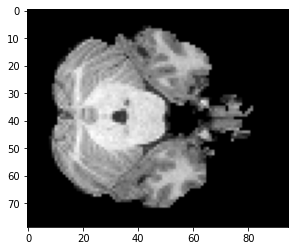

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


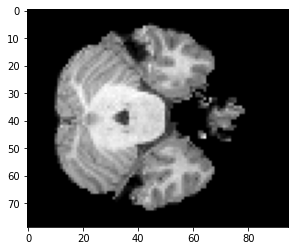

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


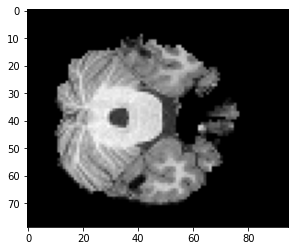

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


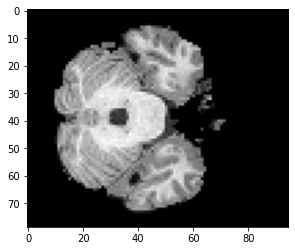

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


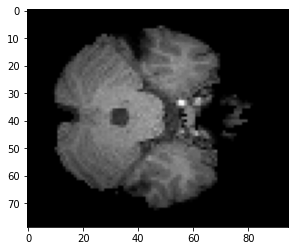

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


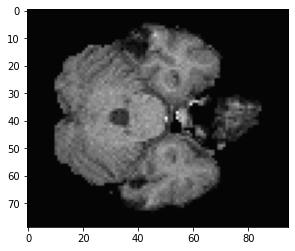

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


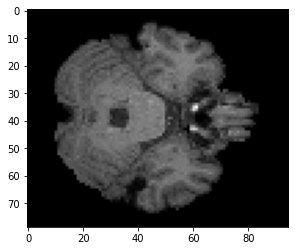

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


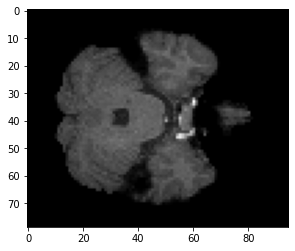

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


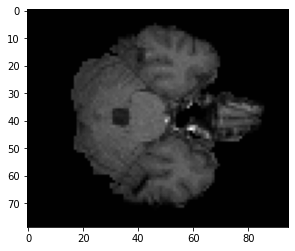

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


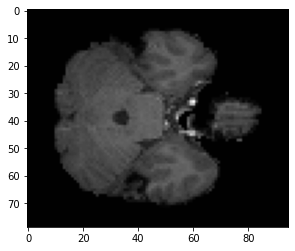

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


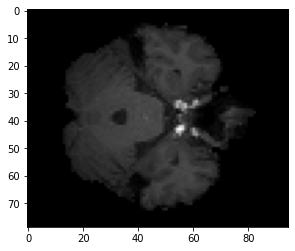

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


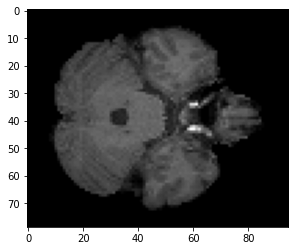

Intensity: float32
Dimension: (79, 95, 79)
Slice Thickness: 2.0
Slice Gap: 1.0
Voxel Resolution: [2. 2. 2.]


In [11]:
categories = ['cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7']

for category in categories:
    for name in imagenames_with_categories[category]:
        # Load the image
        img = nib.load(name)

        # Get the data from the image
        data = img.get_fdata()

        # Display the image using matplotlib
        plt.imshow(data[:, :, 20], cmap='gray')
        plt.show()

        # Get the header information
        header = img.header

        # Get the intensity information
        intensity = header.get_data_dtype()

        # Get the dimension information
        dimension = header.get_data_shape()

        # Get the slice thickness information
        slice_thickness = header['pixdim'][3]

        # Get the slice gap information
        slice_gap = header['pixdim'][4]

        # Get the voxel resolution information
        voxel_resolution = header['pixdim'][1:4]

        # Print the information
        print("Intensity:", intensity)
        print("Dimension:", dimension)
        print("Slice Thickness:", slice_thickness)
        print("Slice Gap:", slice_gap)
        print("Voxel Resolution:", voxel_resolution)


In [13]:
# Define the data augmentation transforms
transform = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=15)
])

In [14]:
class BRAIN_MRI_Dataset(Dataset):
    def __init__(self, df: pd.DataFrame, imfolder: str, train: bool = True, transform=None):
        self.df = df
        self.imfolder = imfolder
        self.train = train
        self.transform=transform

    def __getitem__(self, index):
        filename = 'w' + self.df.iloc[index]['ID_CF'] + '_MRI_sMRI_' + self.df.iloc[index]['ID_CF'] + '_brain.nii.gz';

        im_path = os.path.join(self.imfolder, filename)

        nimg = nb.load(im_path)
        x = np.array(nimg.dataobj)
        x = transforms.ToTensor()(x)
        x = x.unsqueeze(0).type(torch.FloatTensor);
        m = torch.mean(x)
        s = torch.std(x)
        x = (x - m) / s

        if (self.transform):
            x_augmented = self.transform(x)
        else:
            x_augmented = x

        if (self.train):
            y = self.df.iloc[index]['Class']
            return x_augmented, y
        else:
            return x

    def __len__(self):
        return len(self.df)

In [15]:
train = data_df[data_df['Test']==0]
valid = data_df[data_df['Test']==1]


# reset index on both dataframes
train = train.reset_index(drop=True)
valid = valid.reset_index(drop=True)

train_targets = train.Class.values
# targets for validation
valid_targets = valid.Class.values
print("test targets:",valid_targets)

test targets: [1 1 1 1 0 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [16]:
train_dataset=BRAIN_MRI_Dataset(
    df=train,
    imfolder='./',
    train=True,
    transform=transform
)

valid_dataset=BRAIN_MRI_Dataset(
    df=valid,
    imfolder='./',
    train=True,
    transform=None
)

train_loader = DataLoader(
    train_dataset,
    batch_size=5,
    #num_workers=4,
    shuffle=True,
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    #num_workers=4,
    shuffle=False,
)


#Model Building

In [17]:
class ConvNet3d(nn.Module):
    def __init__(self):
        super(ConvNet3d, self).__init__()
        self.conv_layer1 = nn.Conv3d(1,6,3,padding=1)
        self.pool = nn.MaxPool3d(3, 3)
        self.conv_layer2 = nn.Conv3d(6, 16,3,padding=1)
        self.fc1 = nn.Linear(16*8*8*10, 512)
        self.fc2 = nn.Linear(512, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv_layer1(x)))
        x = self.pool(F.relu(self.conv_layer2(x)))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


#Training the model

In [20]:
#fit the model
model = ConvNet3d().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

n_total_steps = len(train_loader)
print("training datasets:",n_total_steps)

print("validating datasets",len(valid_loader))

print("valid_loader:",valid_loader)

# Create lists to store the training loss and accuracy for each epoch
train_losses = []
train_accs = []

for epoch in range(30):
    for i,(images,labels) in enumerate(train_loader):

        images = images.to(device)
        labels = labels.to(device)

        #forward pass
        outputs = model(images)
        loss = criterion(outputs,labels)

        # Calculate accuracy
        _, preds = torch.max(outputs, 1)
        acc = torch.sum(preds == labels).item() / len(labels)

        #backward and optimise
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Append the current loss and accuracy to the lists
        train_losses.append(loss.item())
        train_accs.append(acc)
        
        print(i, images.shape)

    print("number of epochs completed:",epoch)

print('Finished Training')

training datasets: 76
validating datasets 13
valid_loader: <torch.utils.data.dataloader.DataLoader object at 0x7f5d24920430>
0 torch.Size([5, 1, 79, 79, 95])
1 torch.Size([5, 1, 79, 79, 95])
2 torch.Size([5, 1, 79, 79, 95])
3 torch.Size([5, 1, 79, 79, 95])
4 torch.Size([5, 1, 79, 79, 95])
5 torch.Size([5, 1, 79, 79, 95])
6 torch.Size([5, 1, 79, 79, 95])
7 torch.Size([5, 1, 79, 79, 95])
8 torch.Size([5, 1, 79, 79, 95])
9 torch.Size([5, 1, 79, 79, 95])
10 torch.Size([5, 1, 79, 79, 95])
11 torch.Size([5, 1, 79, 79, 95])
12 torch.Size([5, 1, 79, 79, 95])
13 torch.Size([5, 1, 79, 79, 95])
14 torch.Size([5, 1, 79, 79, 95])
15 torch.Size([5, 1, 79, 79, 95])
16 torch.Size([5, 1, 79, 79, 95])
17 torch.Size([5, 1, 79, 79, 95])
18 torch.Size([5, 1, 79, 79, 95])
19 torch.Size([5, 1, 79, 79, 95])
20 torch.Size([5, 1, 79, 79, 95])
21 torch.Size([5, 1, 79, 79, 95])
22 torch.Size([5, 1, 79, 79, 95])
23 torch.Size([5, 1, 79, 79, 95])
24 torch.Size([5, 1, 79, 79, 95])
25 torch.Size([5, 1, 79, 79, 95])
2

#Testing the model 

In [21]:
with torch.no_grad():
    true_positive = 0
    true_negative = 0
    false_positive = 0
    false_negative = 0

    n_correct = 0
    n_samples = 0
    n_class_correct = [0 for i in range(2)]
    n_class_samples = [0 for i in range(2)]
    for images, labels in valid_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        #max returns (value,index)
        _,predicted = torch.max(outputs,1)

        n_samples+=labels.size(0)
        n_correct+=(predicted==labels).sum().item()

        for i in range(4):
            label=labels[i]
            pred=predicted[i]
            if (label == pred):
                n_class_correct[label]+=1
            n_class_samples[label]+=1

            if label == 1 and pred == 1:
                true_positive += 1
            elif label == 0 and pred == 0:
                true_negative += 1
            elif label == 0 and pred == 1:
                false_positive += 1
            elif label == 1 and pred == 0:
                false_negative += 1
        
    acc = 100.0 * n_correct / n_samples
    print(f'Accuracy of the network:{acc}%')
    print("True Positive Rate: ", true_positive)
    print("True Negative Rate: ", true_negative)
    print("False Positive Rate: ", false_positive)
    print("False Negative Rate: ", false_negative)

Accuracy of the network:75.0%
True Positive Rate:  7
True Negative Rate:  32
False Positive Rate:  0
False Negative Rate:  13


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:

def generate_heatmap(model, img, target_class):
  model.eval()
  #img = img.to(device)
  with torch.no_grad():
    logit = model(img)
    prob = F.softmax(logit, dim=1)
    prob = prob[0][target_class]
    grad = torch.autograd.grad(outputs=prob, inputs=img, retain_graph=True,
    create_graph=True)[0]
    grad = grad.view(grad.size(1), -1)
    grad = grad.mean(dim=1)
    grad = grad.view(1, -1, 1, 1)
    heatmap = (grad * img).sum(dim=1, keepdim=True)
    heatmap = heatmap.view(heatmap.size(2), heatmap.size(3))
    heatmap = F.relu(heatmap)
    heatmap /= heatmap.max()
    return heatmap



In [ ]:
for images, labels in valid_loader:
  images, labels = images.cuda(), labels.cuda()
  generate_heatmap(model,images,0)
